In [1]:
%load_ext autoreload
%autoreload 2
import sys
import os
ProjDIR = "/home/jw3514/Work/CellType_Psy/CellTypeBias_VIP/" # Change to your project directory
sys.path.insert(1, f'{ProjDIR}/src/')
from CellType_PSY import *
#import scanpy as sc
HGNC, ENSID2Entrez, GeneSymbol2Entrez, Entrez2Symbol = LoadGeneINFO()

try:
    os.chdir(f"{ProjDIR}/notebooks/")
    print(f"Current working directory: {os.getcwd()}")
except FileNotFoundError as e:
    print(f"Error: Could not change directory - {e}")
except Exception as e:  
    print(f"Unexpected error: {e}")    

Current working directory: /home/jw3514/Work/CellType_Psy/CellTypeBias_VIP/notebooks


In [2]:
import matplotlib.font_manager as fm
font_path = '/usr/share/fonts/truetype/msttcorefonts/Arial.ttf'
fm.fontManager.addfont(font_path)  # Only if you're adding a new font file
fm._load_fontmanager(try_read_cache=False)
#plt.style.use('seaborn-v0_8-paper')
plt.style.use('seaborn-v0_8-whitegrid')

In [3]:
#Bias_Save_Dict = "/home/jw3514/Work/CellType_Psy/CellTypeBias_VIP/dat/Spec_Bias_Jun09/"
#Bias_Save_Dir = "/home/jw3514/Work/CellType_Psy/CellTypeBias_VIP/dat/Spec_Bias_Jul07/"
Bias_Save_Dir = "/home/jw3514/Work/CellType_Psy/CellTypeBias_VIP/dat/Spec_Bias_Jul24/"

SCZ_Bias = pd.read_csv(Bias_Save_Dir + "HCT.SCZ61.addP.csv", index_col=0)
HighIQ_ASD_Bias = pd.read_csv(Bias_Save_Dir + "HCT.ASD61.HIQ.addP.csv", index_col=0)
LowIQ_ASD_Bias = pd.read_csv(Bias_Save_Dir + "HCT.ASD61.LIQ.addP.csv", index_col=0)
X22q_Bias = pd.read_csv(Bias_Save_Dir + "HCT.X22q.addP.csv", index_col=0)
DDD_Bias = pd.read_csv(Bias_Save_Dir + "HCT.DDD.top61.addP.csv", index_col=0)

VNR_Pos_Bias = pd.read_csv(Bias_Save_Dir + "UKBB_VNR_Pos_Bias_addP.csv", index_col=0)
VNR_Neg_Bias = pd.read_csv(Bias_Save_Dir + "UKBB_VNR_Neg_Bias_addP.csv", index_col=0)
EDU_Pos_Bias = pd.read_csv(Bias_Save_Dir + "UKBB_EDU_Pos_Bias_addP.csv", index_col=0)
EDU_Neg_Bias = pd.read_csv(Bias_Save_Dir + "UKBB_EDU_Neg_Bias_addP.csv", index_col=0)

#VNR_Pos_Bias = pd.read_csv(os.path.join(Bias_Save_Dict, "CTBias.VNR.Pos.top61.csv"), index_col=0)
#VNR_Neg_Bias = pd.read_csv(os.path.join(Bias_Save_Dict, "CTBias.VNR.Neg.top61.csv"), index_col=0)

### Cell type bias and rank for each disorders

#### Plot Pvalue BoxPlot (Figure S4)

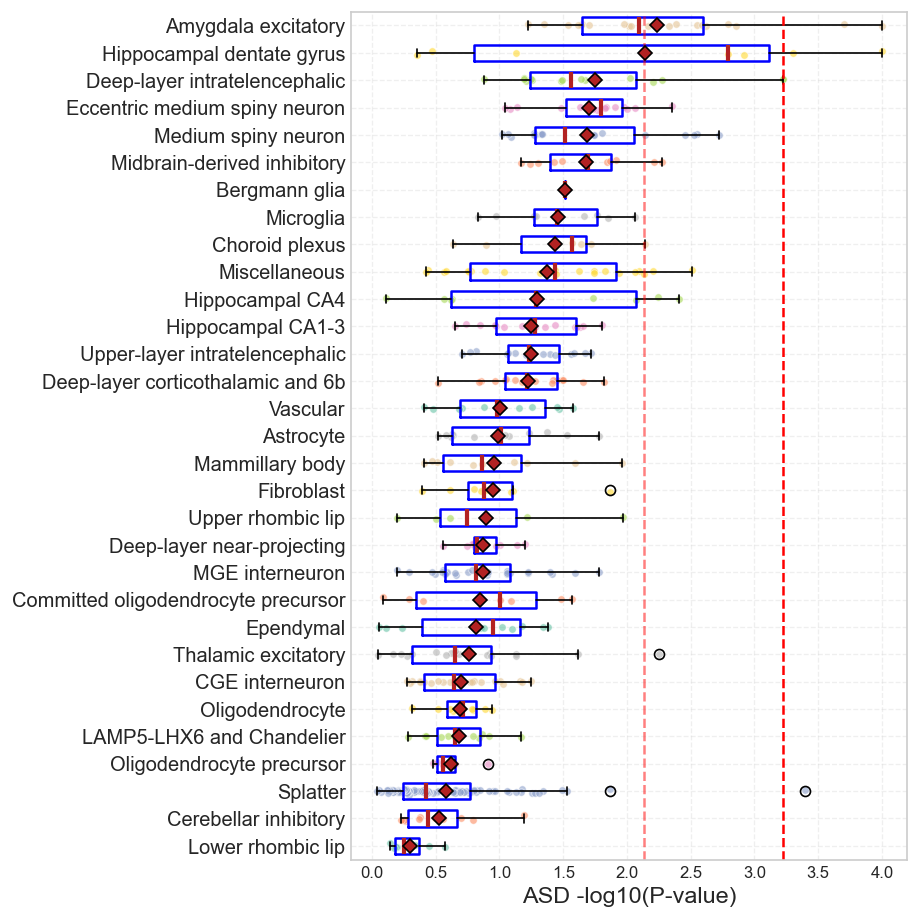

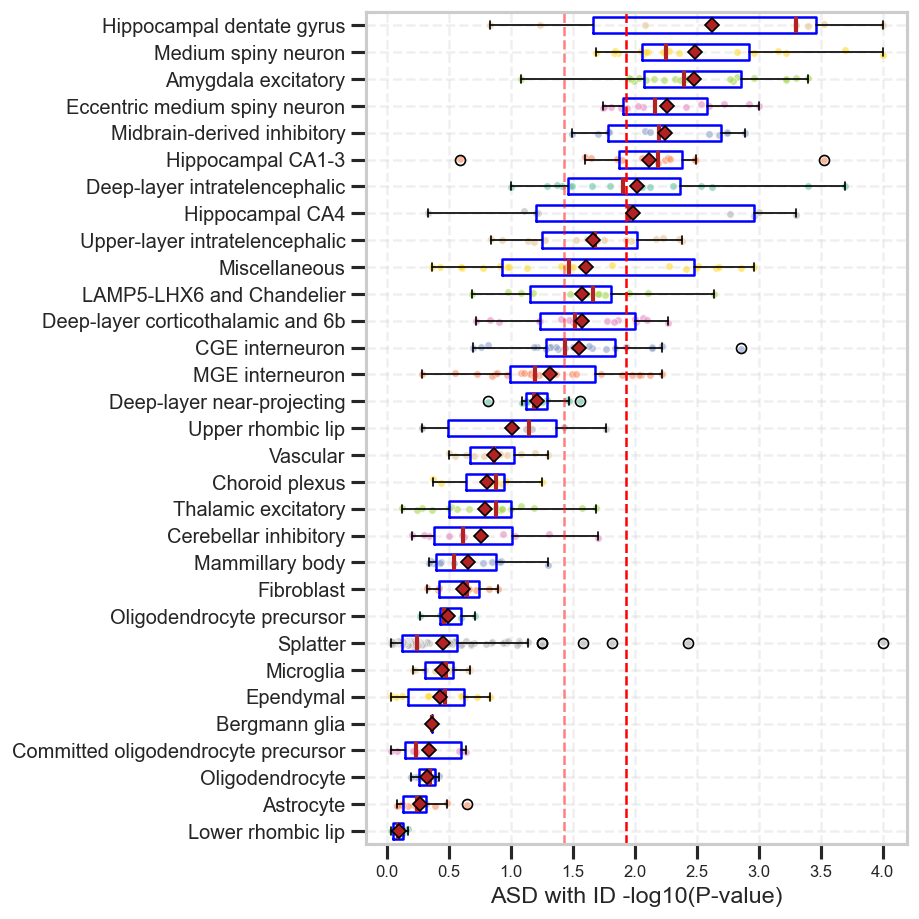

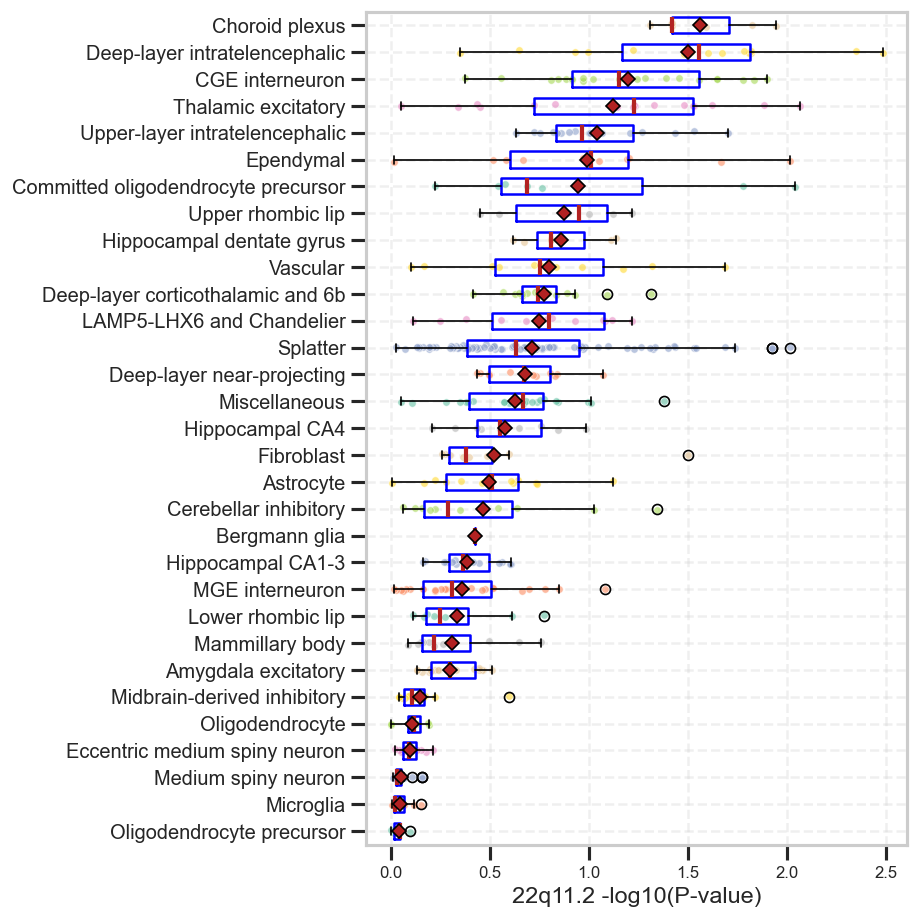

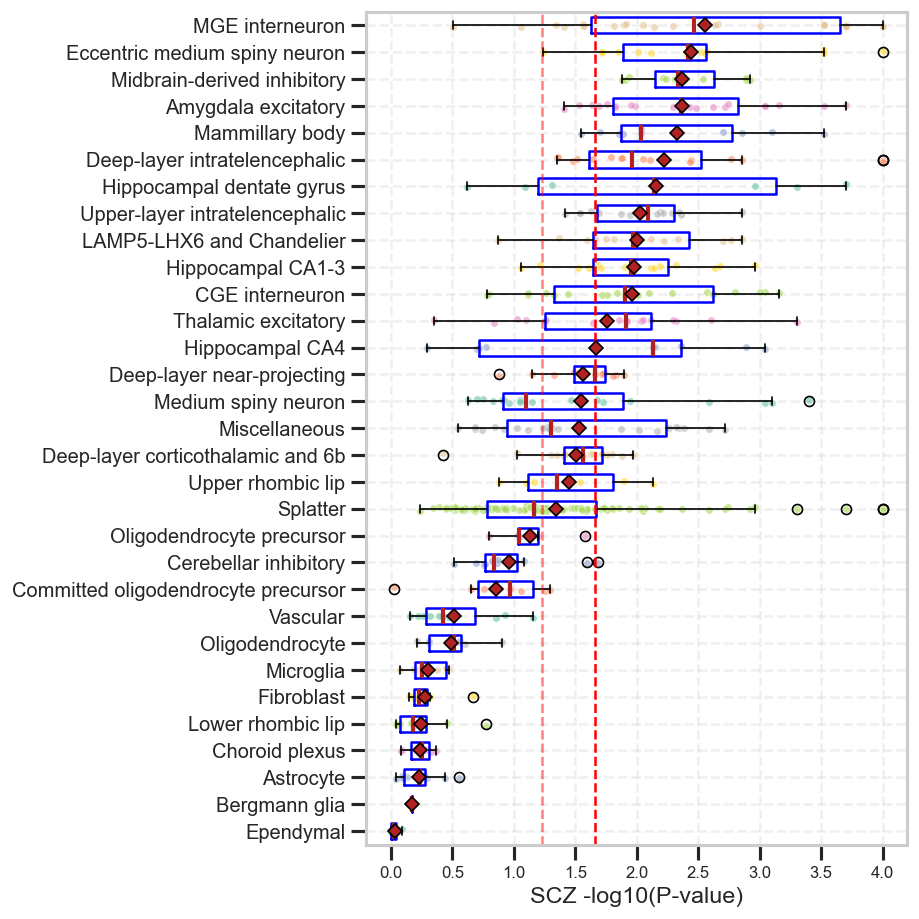

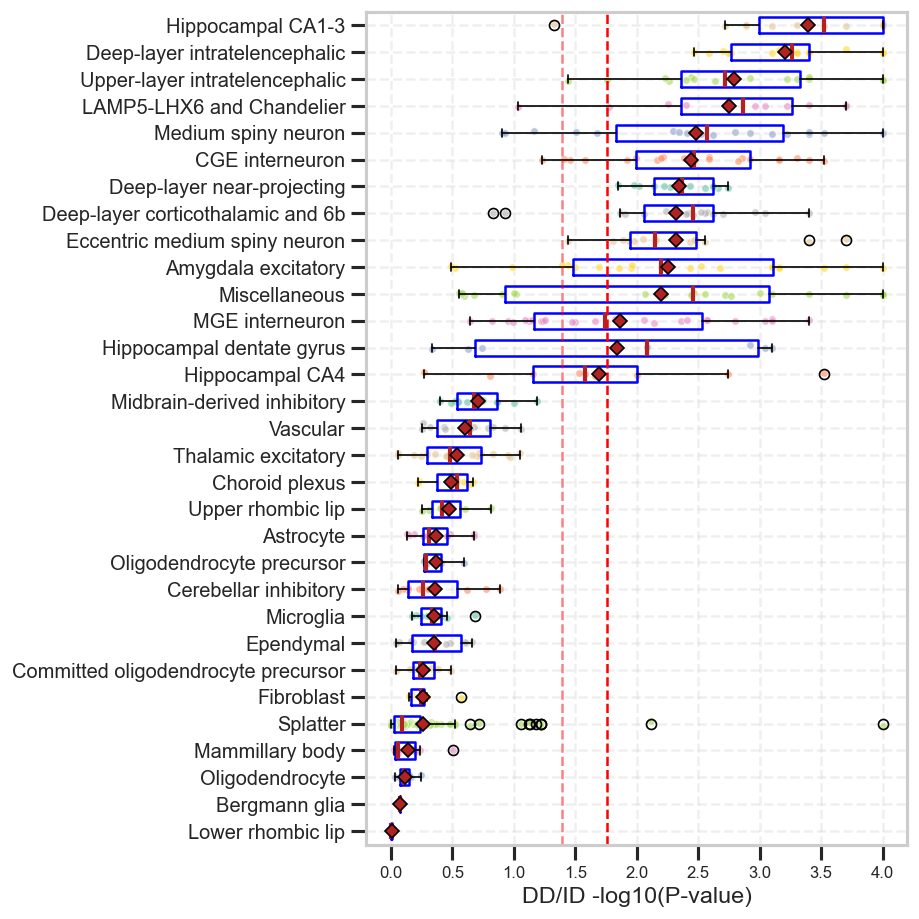

In [4]:
SuperClusterBias_BoxPlot(HighIQ_ASD_Bias, "ASD", NeuroOnly=False, sortby="mean", EffectCol="-logP", fdr_cut=0.1)
SuperClusterBias_BoxPlot(LowIQ_ASD_Bias, "ASD with ID", NeuroOnly=False, sortby="mean", EffectCol="-logP")
SuperClusterBias_BoxPlot(X22q_Bias, "22q11.2", NeuroOnly=False, sortby="mean", EffectCol="-logP", fdr_cut=0.1)
SuperClusterBias_BoxPlot(SCZ_Bias, "SCZ", NeuroOnly=False, sortby="mean", EffectCol="-logP")
SuperClusterBias_BoxPlot(DDD_Bias, "DD/ID", NeuroOnly=False, sortby="mean", EffectCol="-logP")

#### [END] Plot Pvalue BoxPlot

### Bias Correlations and contrast of certain cell types

#### Bias Correlation

In [5]:
HIQ_ASD_SCZ, fig = CompareCT(HighIQ_ASD_Bias, SCZ_Bias, "ASD","SCZ", effectlabel="EFFECT",  SuperClusters=ALL_CTs)
LIQ_ASD_SCZ, fig = CompareCT(LowIQ_ASD_Bias, SCZ_Bias, "ASD","SCZ", effectlabel="EFFECT",  SuperClusters=ALL_CTs)
HIQ_LIQ_ASD, fig = CompareCT(HighIQ_ASD_Bias, LowIQ_ASD_Bias, "ASD","ASD with ID", effectlabel="EFFECT",  SuperClusters=ALL_CTs)

SignificanceResult(statistic=0.38665802743893857, pvalue=6.886571403510827e-18)
SignificanceResult(statistic=0.6615905079547445, pvalue=2.3244840021058274e-59)
SignificanceResult(statistic=0.7357670152162279, pvalue=1.0293648102217881e-79)


???? 1.3524128077417056e-52
???? 1.3524128077417056e-52
Neuron Types:
SpearmanR = 0.68
P = $ P < 10^{-10}$


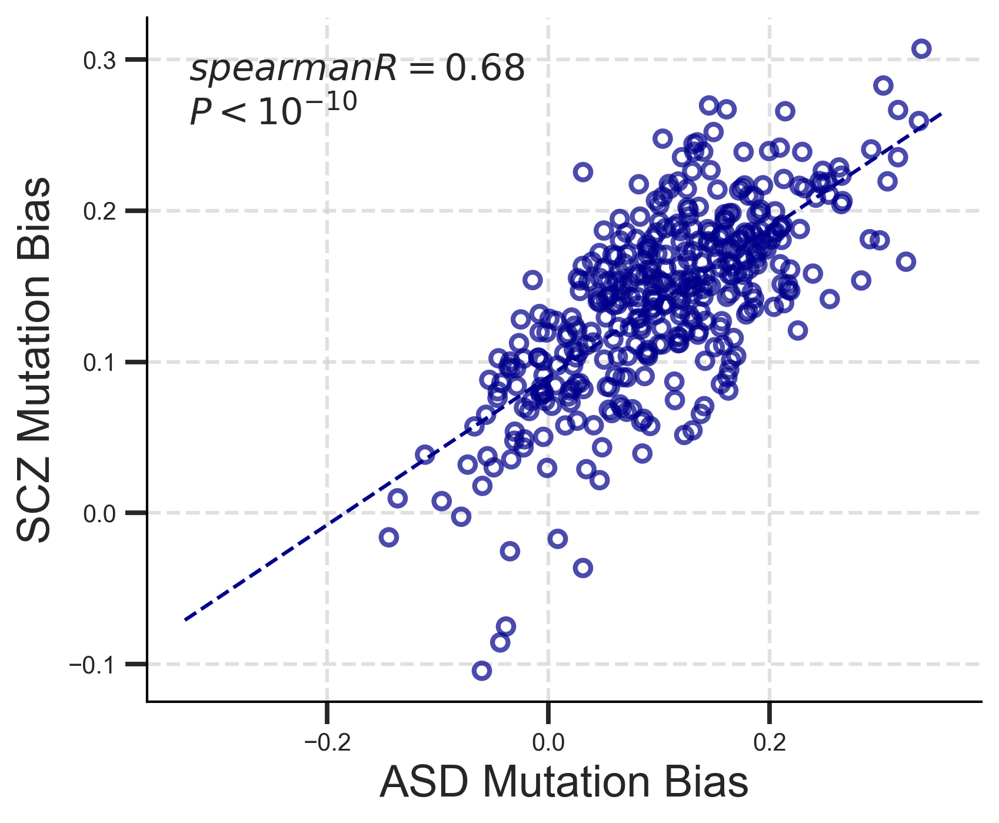

In [6]:
eff_label = "EFFECT"
PlotBiasContrast(HIQ_ASD_SCZ, label1 = "{}_ASD".format(eff_label), label2 = "{}_SCZ".format(eff_label), 
                 name1 = "ASD Mutation Bias", name2 = "SCZ Mutation Bias", 
                title = "", neur_only=True)

In [ ]:
eff_label = "EFFECT"
PlotBiasContrast(HIQ_ASD_SCZ, label1 = "{}_ASD".format(eff_label), label2 = "{}_SCZ".format(eff_label), 
                 name1 = "ASD Mutation Bias", name2 = "SCZ Mutation Bias", 
                title = "", neur_only=True)

???? 3.728503494083827e-45
???? 2.3244840021058274e-59
???? 3.728503494083827e-45
All Cell Types:
SpearmanR = 0.66
P = $ P < 10^{-10}$

Neuron Types:
SpearmanR = 0.64
P = $ P < 10^{-10}$


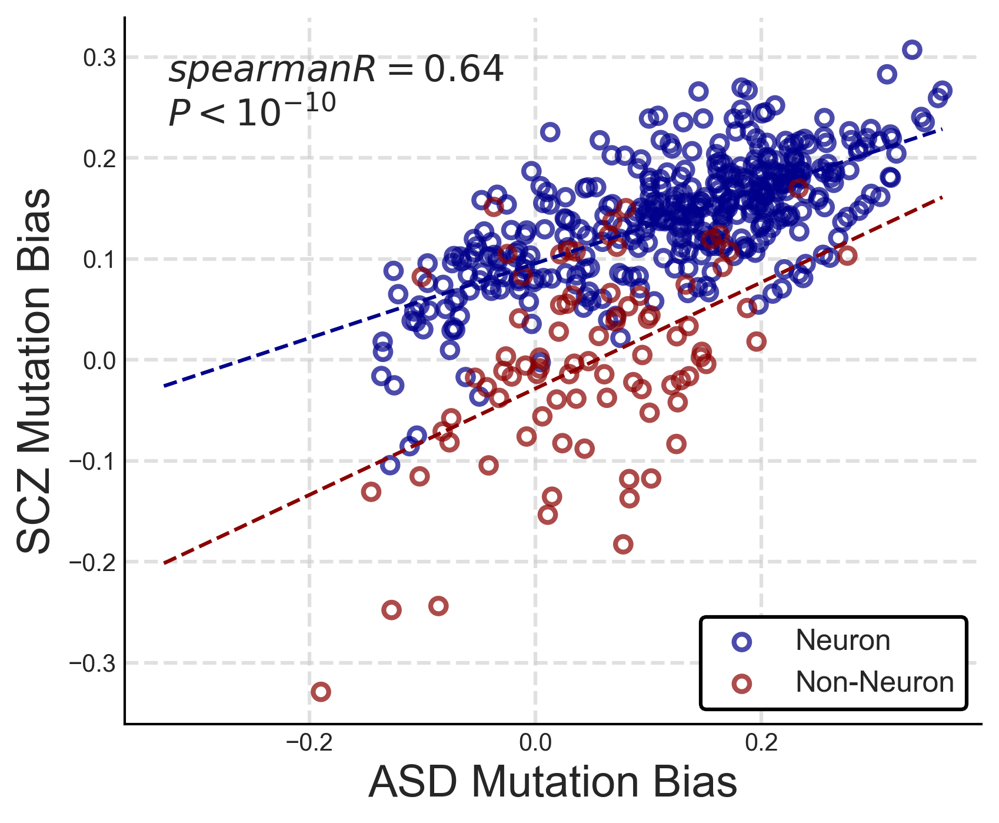

In [7]:
eff_label = "EFFECT"
PlotBiasContrast(LIQ_ASD_SCZ, label1 = "{}_ASD".format(eff_label), label2 = "{}_SCZ".format(eff_label), 
                 name1 = "ASD Mutation Bias", name2 = "SCZ Mutation Bias", 
                title = "")

???? 1.3524128077417056e-52
???? 6.886571403510827e-18
???? 1.3524128077417056e-52
All Cell Types:
SpearmanR = 0.39
P = $ P < 10^{-10}$

Neuron Types:
SpearmanR = 0.68
P = $ P < 10^{-10}$


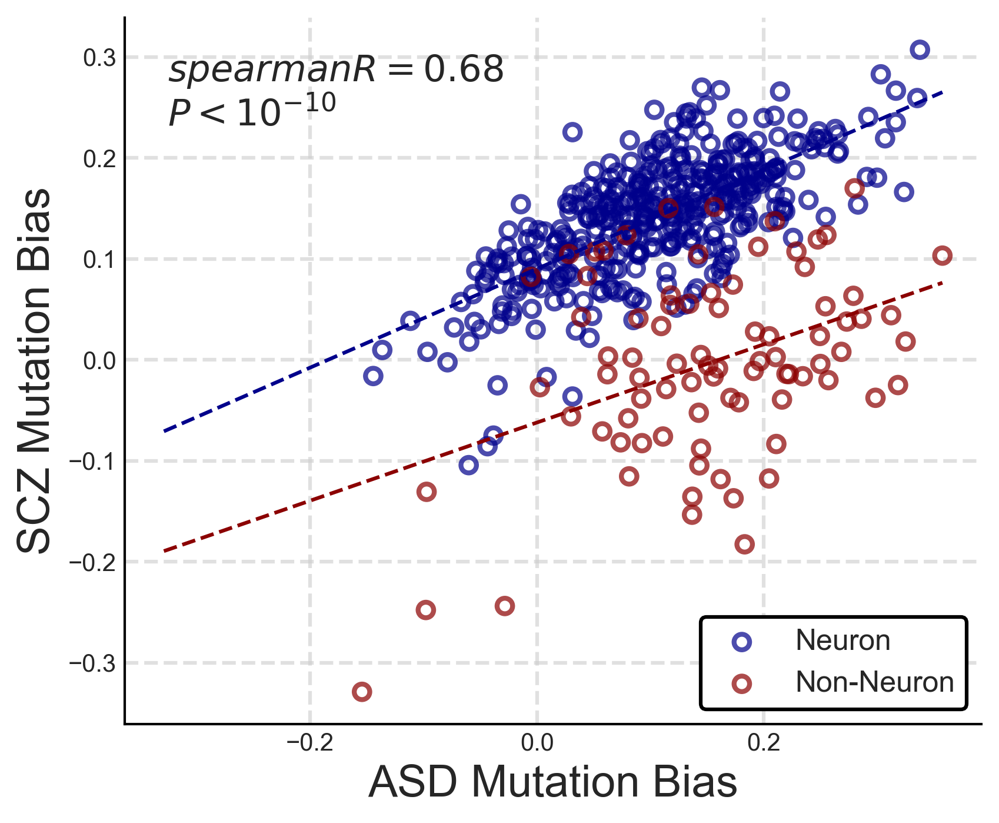

In [8]:

eff_label = "EFFECT"
PlotBiasContrast(HIQ_ASD_SCZ, label1 = "{}_ASD".format(eff_label), label2 = "{}_SCZ".format(eff_label), 
                 name1 = "ASD Mutation Bias", name2 = "SCZ Mutation Bias", 
                title = "")

#### Overall Contrasts

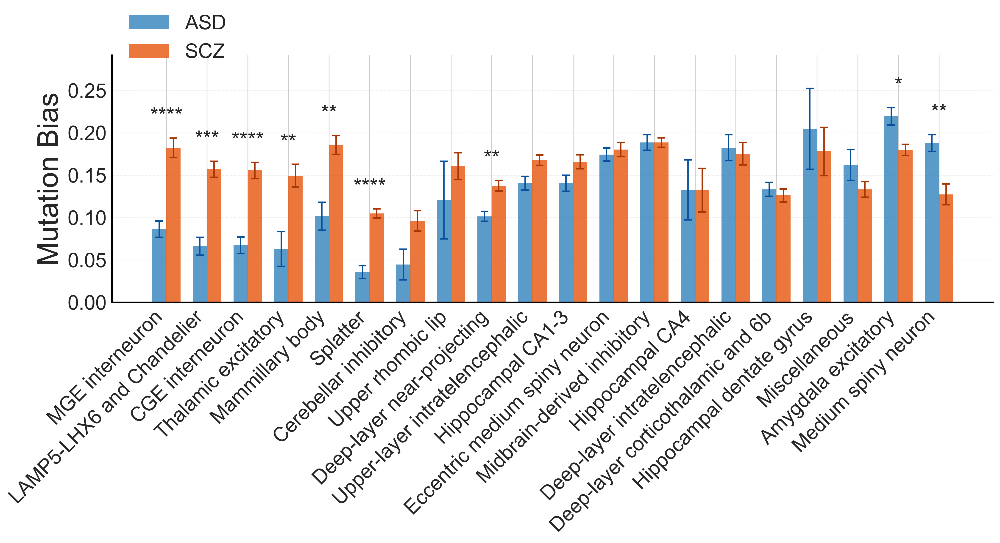

In [9]:
name1="ASD"
name2="SCZ"
EffLabel = "EFFECT"
ASD_SCZ_Contrast = compare_biases(HighIQ_ASD_Bias, SCZ_Bias, name1="ASD", name2="SCZ", efflabel=EffLabel, neurons=Neurons)
ASD_SCZ_Contrast_Neurons = ASD_SCZ_Contrast[ASD_SCZ_Contrast.index.isin(Neurons)]
plot_bias_comparison(ASD_SCZ_Contrast_Neurons, name1, name2, p_test="Mann_Whitney_FDR", legend_anchor=(0.15, 0.9))

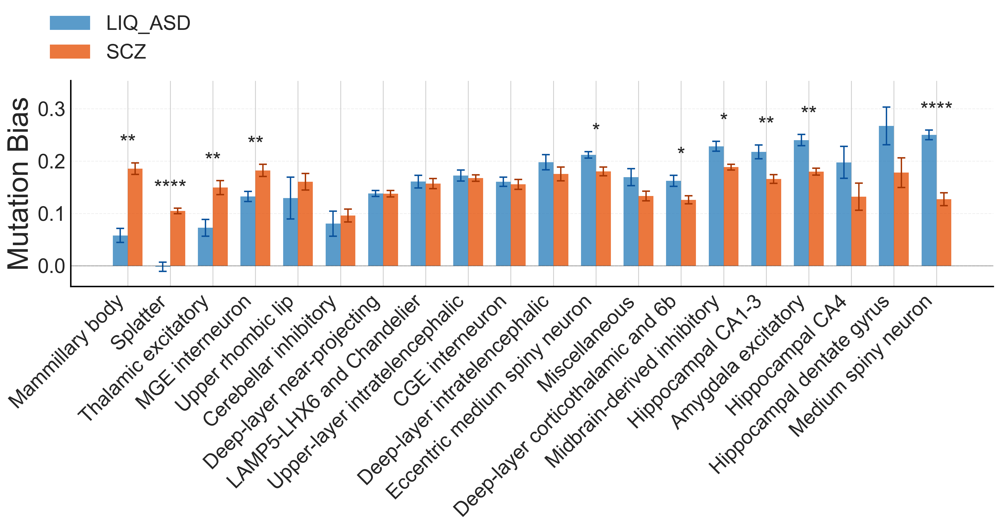

In [10]:
name1="LIQ_ASD"
name2="SCZ"
EffLabel = "EFFECT"
LIQ_ASD_SCZ_Contrast = compare_biases(LowIQ_ASD_Bias, SCZ_Bias, name1=name1, name2=name2, efflabel=EffLabel,neurons=Neurons)
LIQ_ASD_SCZ_Contrast_Neurons = LIQ_ASD_SCZ_Contrast[LIQ_ASD_SCZ_Contrast.index.isin(Neurons)]
#plot_bias_comparison(LIQ_ASD_SCZ_Contrast_Neurons, name1, name2, p_test="Bonferroni_P", legend_anchor=(0.15, 1.0))
plot_bias_comparison(LIQ_ASD_SCZ_Contrast_Neurons, name1, name2, p_test="Mann_Whitney_FDR", legend_anchor=(0.15, 1.0))   


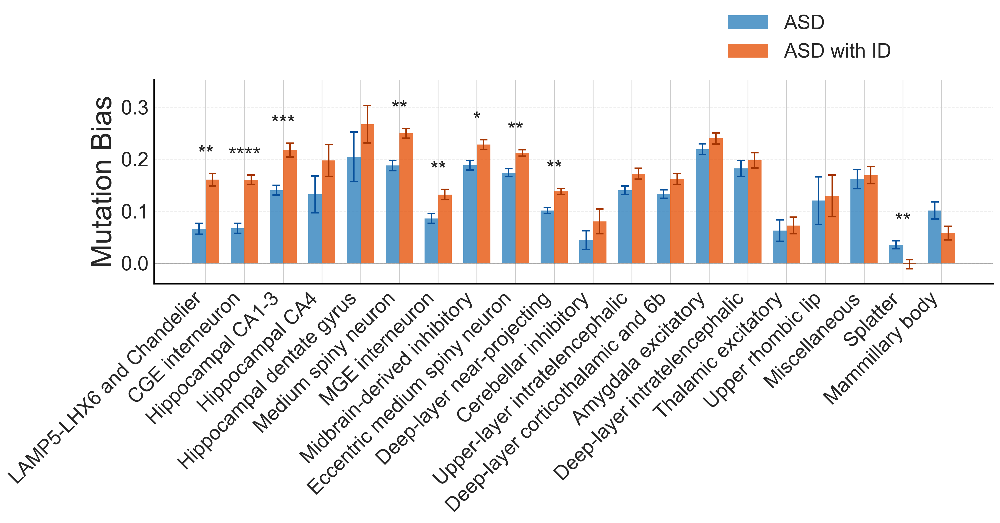

In [11]:
name1="ASD"
name2="ASD with ID"
EffLabel = "EFFECT"
#HIQ_LIQ_ASD_Contrast  = compare_biases(HighIQ_ASD_Bias, LowIQ_ASD_Bias, name1="ASD", name2="ASD with ID", efflabel="EFFECT", neurons=ALL_CTs)
HIQ_LIQ_ASD_Contrast  = compare_biases(HighIQ_ASD_Bias, LowIQ_ASD_Bias, name1="ASD", name2="ASD with ID", efflabel=EffLabel, neurons=ALL_CTs)
# Set index to CT column before filtering to avoid SettingWithCopyWarning
HIQ_LIQ_ASD_Contrast_Neurons = HIQ_LIQ_ASD_Contrast[HIQ_LIQ_ASD_Contrast.index.isin(Neurons)]
plot_bias_comparison(HIQ_LIQ_ASD_Contrast_Neurons, name1, name2, p_test="Mann_Whitney_FDR", legend_anchor=(0.9, 1.0)) 
#plot_bias_comparison(HIQ_LIQ_ASD_Contrast_Neurons, name1, name2, p_test="Bonferroni_P", legend_anchor=(0.9, 1.0))
#plot_bias_comparison(HIQ_LIQ_ASD_Contrast_Neurons, name1, name2, p_test="Wilcoxon_FDR", legend_anchor=(0.9, 0))

#### Individual CT Contrasts

???? 0.163895763240863


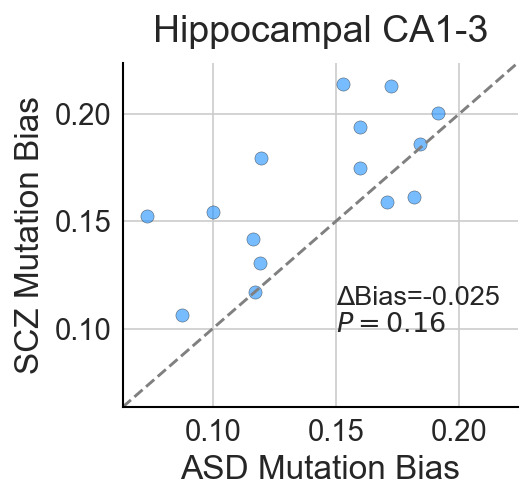

???? 0.060576201407819205


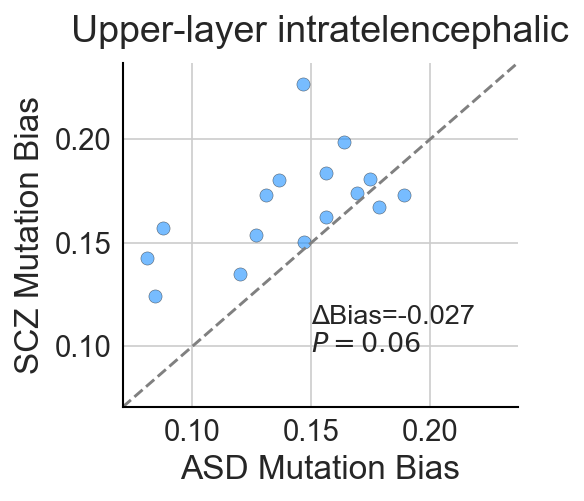

???? 0.9259510452881968


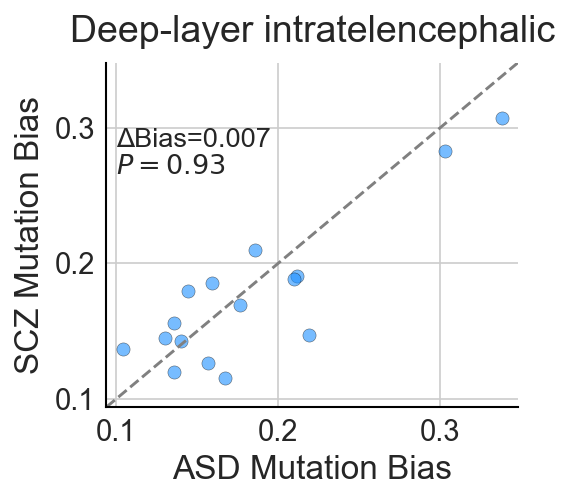

???? 0.017266643160332


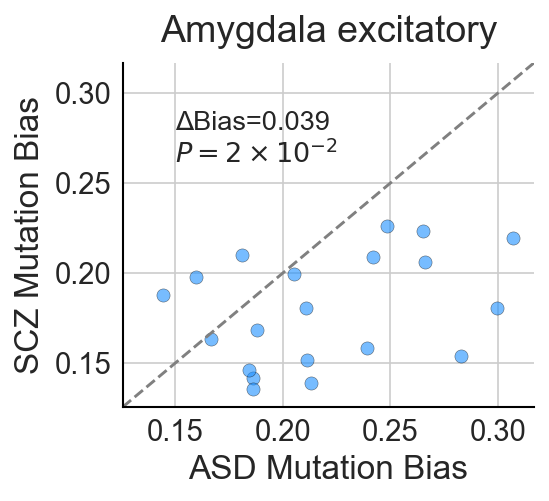

???? 0.005159314921865559


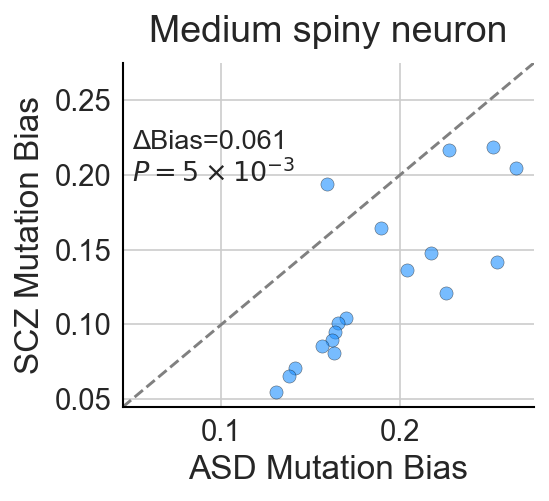

???? 0.611459112068922


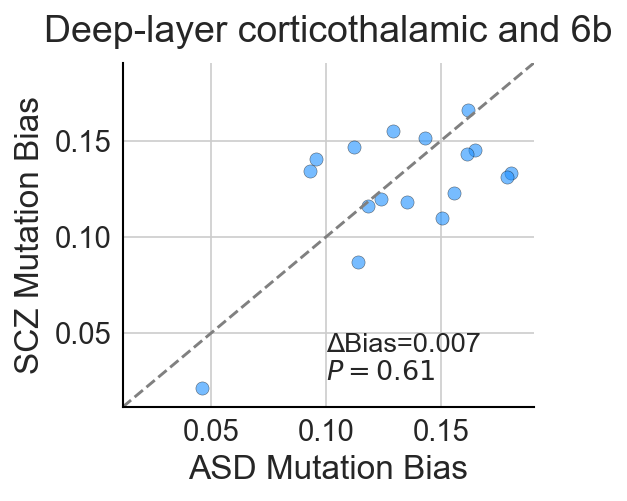

???? 2.005784372099726e-05


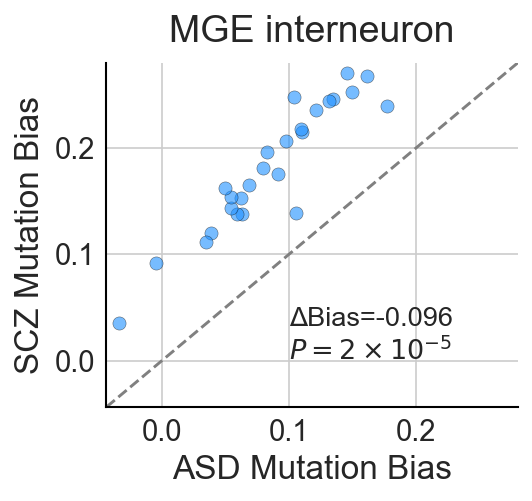

In [12]:
EffLabel = "EFFECT"
CompareSingleCT(HighIQ_ASD_Bias, SCZ_Bias,  "Hippocampal CA1-3",  ASD_SCZ_Contrast,
                    "ASD Mutation Bias", "SCZ Mutation Bias", efflabel=EffLabel, loc=(0.15, 0.12))
CompareSingleCT(HighIQ_ASD_Bias, SCZ_Bias, "Upper-layer intratelencephalic",  ASD_SCZ_Contrast,
                    "ASD Mutation Bias", "SCZ Mutation Bias", efflabel=EffLabel, pval="Mann_Whitney_FDR", loc=(0.15, 0.12))
CompareSingleCT(HighIQ_ASD_Bias, SCZ_Bias, "Deep-layer intratelencephalic",   ASD_SCZ_Contrast, 
                    "ASD Mutation Bias", "SCZ Mutation Bias", loc=(0.1, 0.3), pval="Mann_Whitney_FDR")
CompareSingleCT(HighIQ_ASD_Bias, SCZ_Bias, "Amygdala excitatory",  ASD_SCZ_Contrast,
                    "ASD Mutation Bias", "SCZ Mutation Bias", efflabel=EffLabel, loc=(0.15, 0.29))
CompareSingleCT(HighIQ_ASD_Bias, SCZ_Bias, "Medium spiny neuron",  ASD_SCZ_Contrast,
                     "ASD Mutation Bias", "SCZ Mutation Bias", efflabel=EffLabel, pval="Mann_Whitney_FDR", loc=(0.05, 0.23))
CompareSingleCT(HighIQ_ASD_Bias, SCZ_Bias, "Deep-layer corticothalamic and 6b",  ASD_SCZ_Contrast,
                     "ASD Mutation Bias", "SCZ Mutation Bias", efflabel=EffLabel, loc=(0.1, 0.05))
CompareSingleCT(HighIQ_ASD_Bias, SCZ_Bias, "MGE interneuron",   ASD_SCZ_Contrast,
                    "ASD Mutation Bias", "SCZ Mutation Bias", loc=(0.1, 0.05))

### SCZ HIQ 22q VIP

???? 4.842922275769923e-05


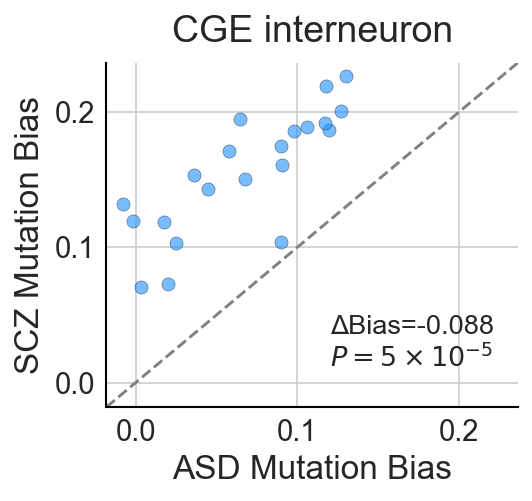

???? 0.8830948621691144


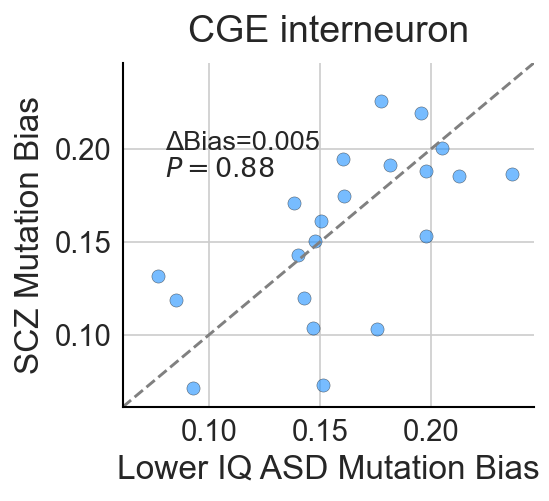

???? 3.7308996225286946e-05


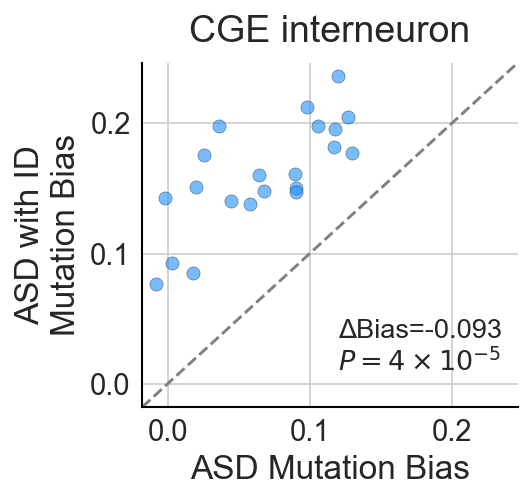

In [13]:
CompareSingleCT(HighIQ_ASD_Bias, SCZ_Bias, "CGE interneuron",   ASD_SCZ_Contrast, "ASD Mutation Bias", 
                    "SCZ Mutation Bias", efflabel=EffLabel, loc=(0.12, 0.05))
CompareSingleCT(LowIQ_ASD_Bias, SCZ_Bias, "CGE interneuron",  LIQ_ASD_SCZ_Contrast, "Lower IQ ASD Mutation Bias", 
                    "SCZ Mutation Bias", efflabel=EffLabel, loc=(0.08, 0.21))
CompareSingleCT(HighIQ_ASD_Bias, LowIQ_ASD_Bias, "CGE interneuron", HIQ_LIQ_ASD_Contrast_Neurons, "ASD Mutation Bias", 
                    "ASD with ID\nMutation Bias", loc=(0.12, 0.05), efflabel=EffLabel)

???? 0.06762189786359882


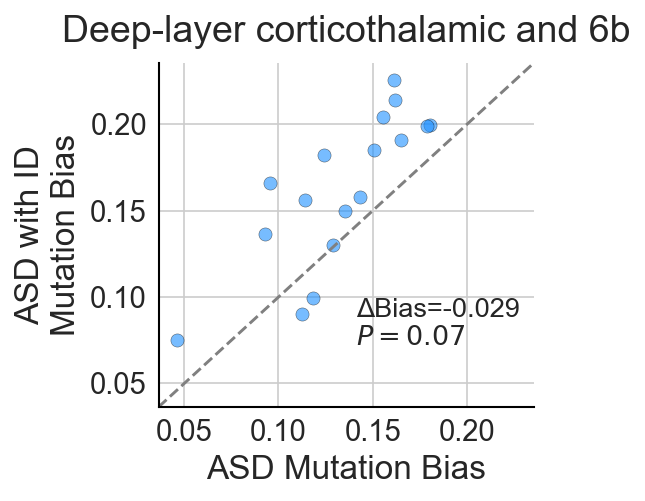

???? 0.2182497173402485


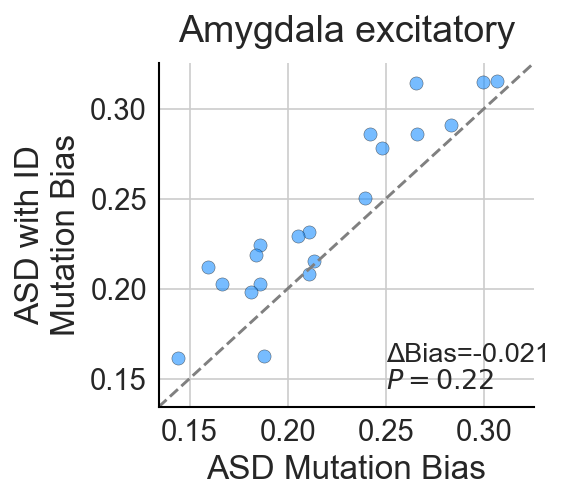

???? 0.05520143544845295


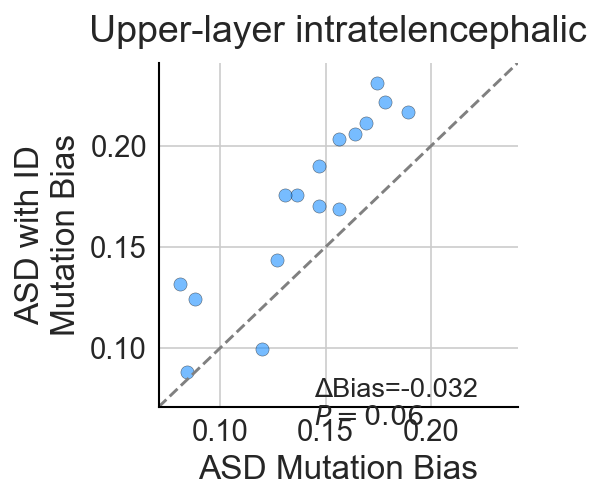

???? 0.41099349546983405


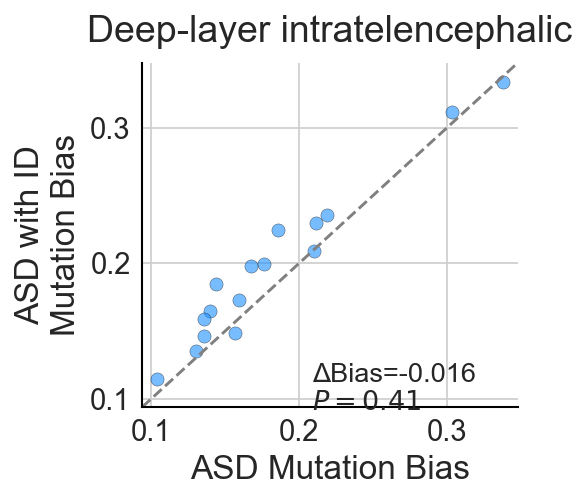

In [14]:
CompareSingleCT(HighIQ_ASD_Bias, LowIQ_ASD_Bias, "Deep-layer corticothalamic and 6b", HIQ_LIQ_ASD_Contrast_Neurons, "ASD Mutation Bias", 
                    "ASD with ID\nMutation Bias", loc=2, efflabel=EffLabel)
CompareSingleCT(HighIQ_ASD_Bias, LowIQ_ASD_Bias, "Amygdala excitatory", HIQ_LIQ_ASD_Contrast_Neurons, "ASD Mutation Bias", 
                    "ASD with ID\nMutation Bias", efflabel=EffLabel, loc=(0.25, 0.17))
CompareSingleCT(HighIQ_ASD_Bias, LowIQ_ASD_Bias, "Upper-layer intratelencephalic", HIQ_LIQ_ASD_Contrast_Neurons, "ASD Mutation Bias", 
                    "ASD with ID\nMutation Bias", loc=2, efflabel=EffLabel)
CompareSingleCT(HighIQ_ASD_Bias, LowIQ_ASD_Bias, "Deep-layer intratelencephalic", HIQ_LIQ_ASD_Contrast_Neurons, "ASD Mutation Bias", 
                    "ASD with ID\nMutation Bias", loc=2, efflabel=EffLabel)

In [15]:
VNR_Contrast = compare_biases(VNR_Neg_Bias, VNR_Pos_Bias, name1="VNR-", name2="VNR+", neurons=ALL_CTs)
EDU_Contrast = compare_biases(EDU_Neg_Bias, EDU_Pos_Bias, name1="EDU-", name2="EDU+", neurons=ALL_CTs)
VNR_Contrast_Neurons = VNR_Contrast[VNR_Contrast.index.isin(Neurons)]
EDU_Contrast_Neurons = EDU_Contrast[EDU_Contrast.index.isin(Neurons)]
VNR_Contrast_Neurons = VNR_Contrast_Neurons.sort_values(by="Bias_Diff", ascending=False)
EDU_Contrast_Neurons = EDU_Contrast_Neurons.sort_values(by="Bias_Diff", ascending=False)

???? 4.844369997521352e-07


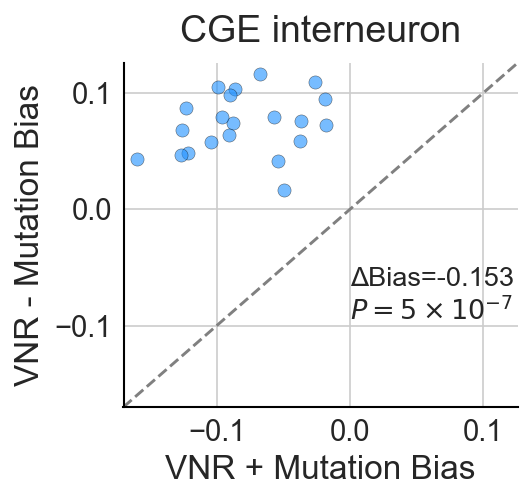

???? 1.98061029084779e-06


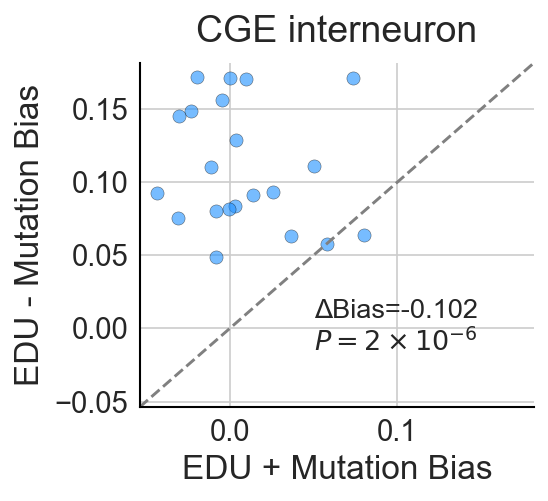

In [16]:
CompareSingleCT(VNR_Pos_Bias, VNR_Neg_Bias, "CGE interneuron", VNR_Contrast, "VNR + Mutation Bias", 
                    "VNR - Mutation Bias",loc=(0.0, -0.05))

CompareSingleCT(EDU_Pos_Bias, EDU_Neg_Bias, "CGE interneuron", EDU_Contrast, "EDU + Mutation Bias", 
                "EDU - Mutation Bias",loc=(0.05, 0.02))

# CompareSingleCT(RT_Pos_Bias, RT_Neg_Bias, "CGE interneuron", RT_Contrast, "RT + Mutation Bias", 
#                "RT - Mutation Bias",loc=(-0.05, 0.045))

In [17]:
DDD_ASD_Contrast = compare_biases(HighIQ_ASD_Bias, DDD_Bias, name1="ASD", name2="DD/ID", neurons=Neurons)
DDD_ASD_Contrast_Neurons = DDD_ASD_Contrast[DDD_ASD_Contrast.index.isin(Neurons)]

???? 7.430315384634494e-07


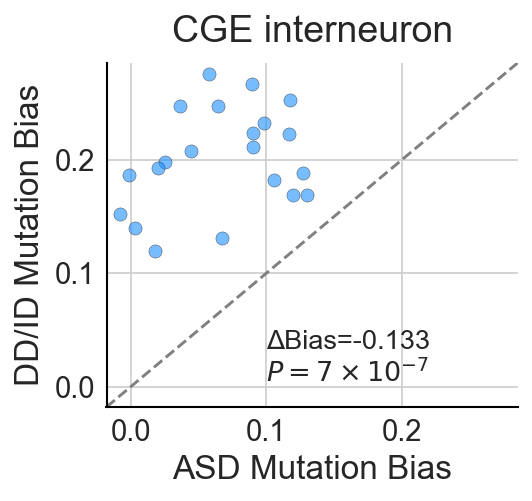

In [18]:
CompareSingleCT(HighIQ_ASD_Bias, DDD_Bias, "CGE interneuron", DDD_ASD_Contrast,  "ASD Mutation Bias", 
                    "DD/ID Mutation Bias",loc=(0.1, 0.05))

### Figure 2Boxplot

#### Multi-Pair Plot

??? 4.844369997521352e-06
???? 4.844369997521352e-06
VNR+ vs VNR-: $P = 5 \times 10^{-6}$
???? 4.844369997521352e-06
??? 0.0007264383413654883
???? 0.0007264383413654883
ASD vs SCZ: $P = 7 \times 10^{-4}$
???? 0.0007264383413654883
??? 0.00018654498112643473
???? 0.00018654498112643473
ASD vs ASD with ID: $P = 2 \times 10^{-4}$
???? 0.00018654498112643473
??? 7.4303153846344935e-06
???? 7.4303153846344935e-06
ASD vs DD/ID: $P = 7 \times 10^{-6}$
???? 7.4303153846344935e-06


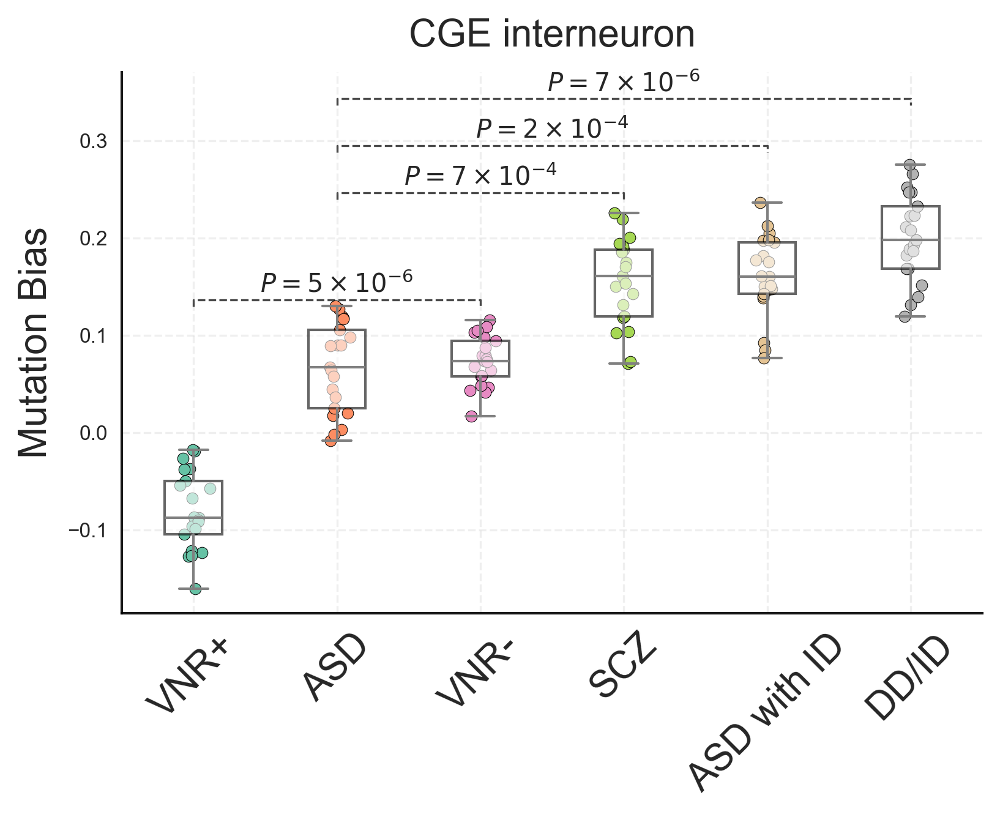

In [107]:
# Example usage:
datasets = {
    'ASD': HighIQ_ASD_Bias,
    'ASD with ID': LowIQ_ASD_Bias,
    'VNR+': VNR_Pos_Bias,
    'VNR-': VNR_Neg_Bias,
    'DD/ID': DDD_Bias,
    'SCZ': SCZ_Bias
}
TestPairs=[("VNR+", "VNR-"), ("ASD", "SCZ"), ("ASD", "ASD with ID"), ("ASD", "DD/ID")]
SuperCluster = "CGE interneuron"
plot_mutation_bias_comparison(SuperCluster, datasets, Anno, TestPairs=TestPairs)

??? 1.0
???? 1.0
VNR+ vs VNR-: $P = 1$
???? 1.0
??? 0.0002005784372099726
???? 0.0002005784372099726
ASD vs SCZ: $P = 2 \times 10^{-4}$
???? 0.0002005784372099726
??? 0.2978857260544333
???? 0.2978857260544333
ASD vs ASD with ID: $P = 0.30$
???? 0.2978857260544333
??? 0.022655503008264872
???? 0.022655503008264872
ASD vs DD/ID: $P = 2 \times 10^{-2}$
???? 0.022655503008264872


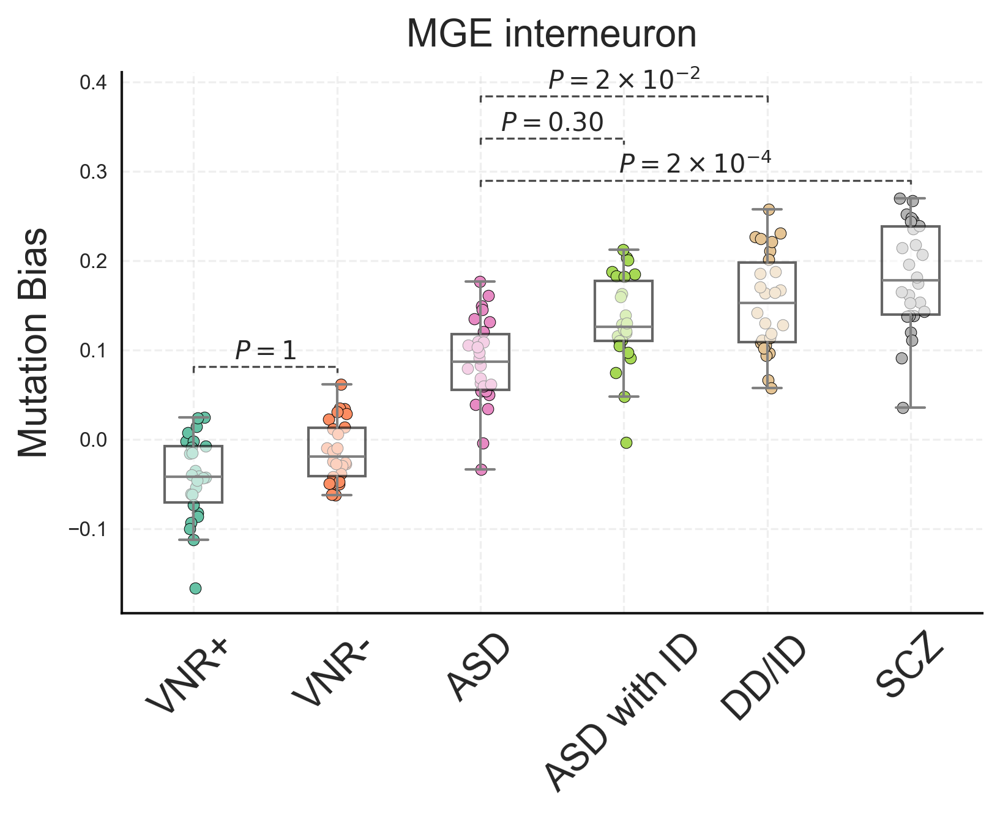

In [108]:
SuperCluster = "MGE interneuron"
plot_mutation_bias_comparison(SuperCluster, datasets, Anno, TestPairs=TestPairs)

??? 0.00727705247567851
???? 0.00727705247567851
VNR+ vs VNR-: $P = 7 \times 10^{-3}$
???? 0.00727705247567851
??? 0.02414836342862186
???? 0.02414836342862186
ASD vs SCZ: $P = 2 \times 10^{-2}$
???? 0.02414836342862186
??? 0.03040502842451412
???? 0.03040502842451412
ASD vs ASD with ID: $P = 3 \times 10^{-2}$
???? 0.03040502842451412
??? 0.00727705247567851
???? 0.00727705247567851
ASD vs DD/ID: $P = 7 \times 10^{-3}$
???? 0.00727705247567851


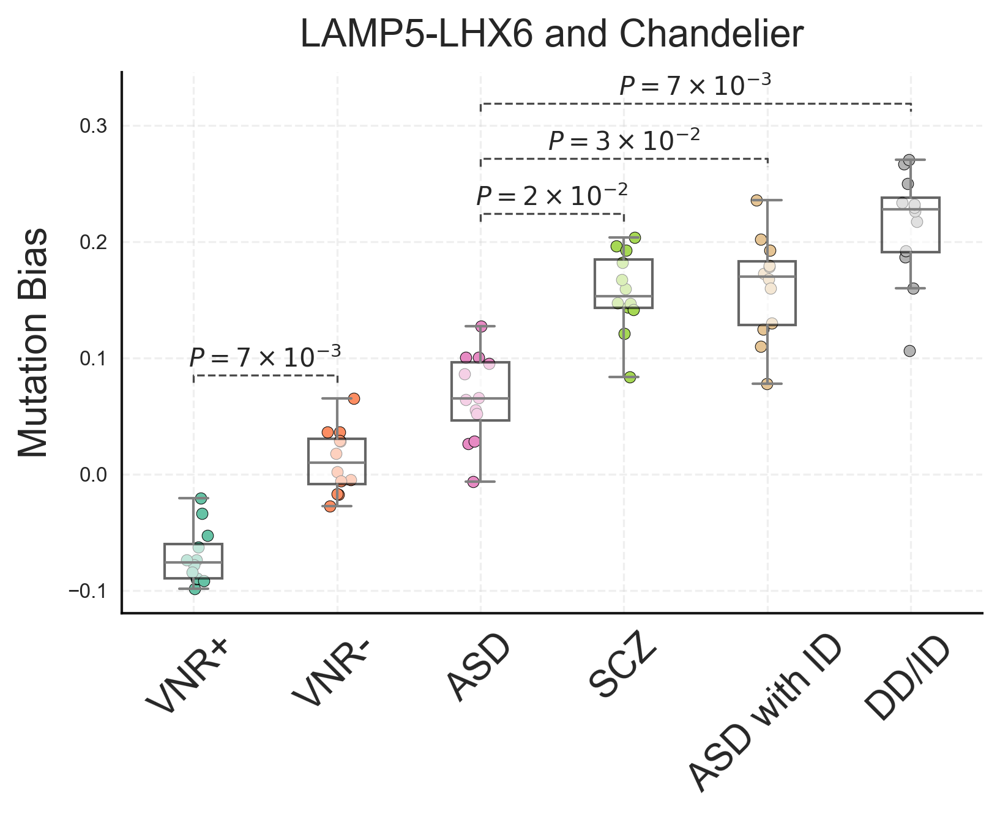

In [109]:
SuperCluster = "LAMP5-LHX6 and Chandelier"
plot_mutation_bias_comparison(SuperCluster, datasets, Anno, TestPairs=TestPairs)

In [110]:
Test = [("VNR+", "VNR-"), ("ASD", "SCZ"), ("ASD", "ASD with ID"), ("ASD", "DD/ID")]
Contrast_List = [VNR_Contrast, ASD_SCZ_Contrast, HIQ_LIQ_ASD_Contrast_Neurons, DDD_ASD_Contrast]

In [111]:
VNR_Contrast.head(2)

,Bias_VNR-,Bias_VNR+,STM_VNR-,STM_VNR+,Bias_Diff,Mann_Whitney_P,Wilcoxon_P,Mann_Whitney_FDR,Wilcoxon_FDR,Bonferroni_P
Supercluster,,,,,,,,,,
Fibroblast,-0.126683,0.093236,0.010746,0.018409,-0.21992,0.000155,0.007812,0.000344,0.010530,0.242188
Microglia,-0.126416,0.015944,0.014558,0.010068,-0.14236,0.000412,0.003906,0.000710,0.006373,0.121094


In [112]:
# combine all contrast list and do FDR correction
import pandas as pd

# Contrast_List = [VNR_Contrast, EDU_Contrast, ASD_SCZ_Contrast, HIQ_LIQ_ASD_Contrast_Neurons, DDD_ASD_Contrast]
# Test = [("VNR+", "VNR-"), ("EDU+", "EDU-"), ("ASD", "SCZ"), ("ASD", "ASD with ID"), ("ASD", "DD/ID")]

Contrast_List = [VNR_Contrast, ASD_SCZ_Contrast, HIQ_LIQ_ASD_Contrast_Neurons, DDD_ASD_Contrast]
Test = [("VNR+", "VNR-"), ("ASD", "SCZ"), ("ASD", "ASD with ID"), ("ASD", "DD/ID")]

all_contrasts_rows = []

for pair, DF in zip(Test, Contrast_List):
    Pairname = pair[0] + " - " + pair[1]
    print(Pairname)
    for supercluster, row in DF.iterrows():
        Pair = Pairname
        SuperCluster = supercluster
        Bias1 = row["Bias_" + pair[0]]
        Bias2 = row["Bias_" + pair[1]]
        BiasDiff = row["Bias_Diff"]
        Pval = row["Mann_Whitney_P"]
        FDR = row["Mann_Whitney_FDR"]
        all_contrasts_rows.append([Pair, SuperCluster, Bias1, Bias2, BiasDiff, Pval, FDR])

all_contrasts_df = pd.DataFrame(
    all_contrasts_rows,
    columns=["Pair", "SuperCluster", "Bias1", "Bias2", "BiasDiff", "Pval", "MWU_FDR"]
)


VNR+ - VNR-
ASD - SCZ
ASD - ASD with ID
ASD - DD/ID


In [113]:
all_contrasts_df["ALL_FDR"] = fdrcorrection(all_contrasts_df["Pval"])[1]

??? 4.844369997521352e-07
???? 4.844369997521352e-07
VNR+ vs VNR-: $P = 5 \times 10^{-7}$
???? 4.844369997521352e-07
??? 4.842922275769923e-05
???? 4.842922275769923e-05
ASD vs SCZ: $P = 5 \times 10^{-5}$
???? 4.842922275769923e-05
??? 3.7308996225286946e-05
???? 3.7308996225286946e-05
ASD vs ASD with ID: $P = 4 \times 10^{-5}$
???? 3.7308996225286946e-05
??? 7.430315384634494e-07
???? 7.430315384634494e-07
ASD vs DD/ID: $P = 7 \times 10^{-7}$
???? 7.430315384634494e-07


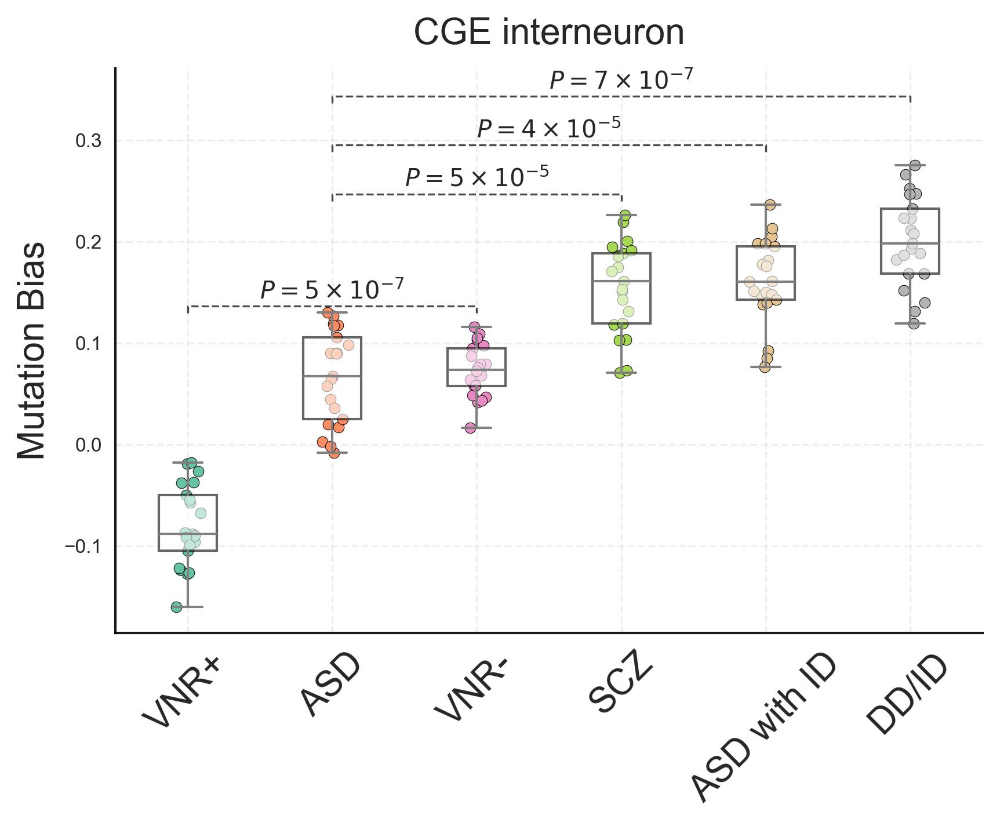

In [127]:
#Test = [("VNR+", "VNR-"), ("EDU+", "EDU-"), ("ASD", "SCZ"), ("ASD", "ASD with ID"), ("ASD", "DD/ID")]
Test = [("VNR+", "VNR-"), ("ASD", "SCZ"), ("ASD", "ASD with ID"), ("ASD", "DD/ID")]
SuperCluster = "CGE interneuron"
plot_mutation_bias_comparison_V2(SuperCluster, datasets, Anno, all_contrasts_df, TestPairs=Test)

??? 0.03589578949647871
???? 0.03589578949647871
VNR+ vs VNR-: $P = 4 \times 10^{-2}$
???? 0.03589578949647871
??? 2.005784372099726e-05
???? 2.005784372099726e-05
ASD vs SCZ: $P = 2 \times 10^{-5}$
???? 2.005784372099726e-05
??? 0.005416104110080606
???? 0.005416104110080606
ASD vs ASD with ID: $P = 5 \times 10^{-3}$
???? 0.005416104110080606
??? 0.0004014504014504015
???? 0.0004014504014504015
ASD vs DD/ID: $P = 4 \times 10^{-4}$
???? 0.0004014504014504015


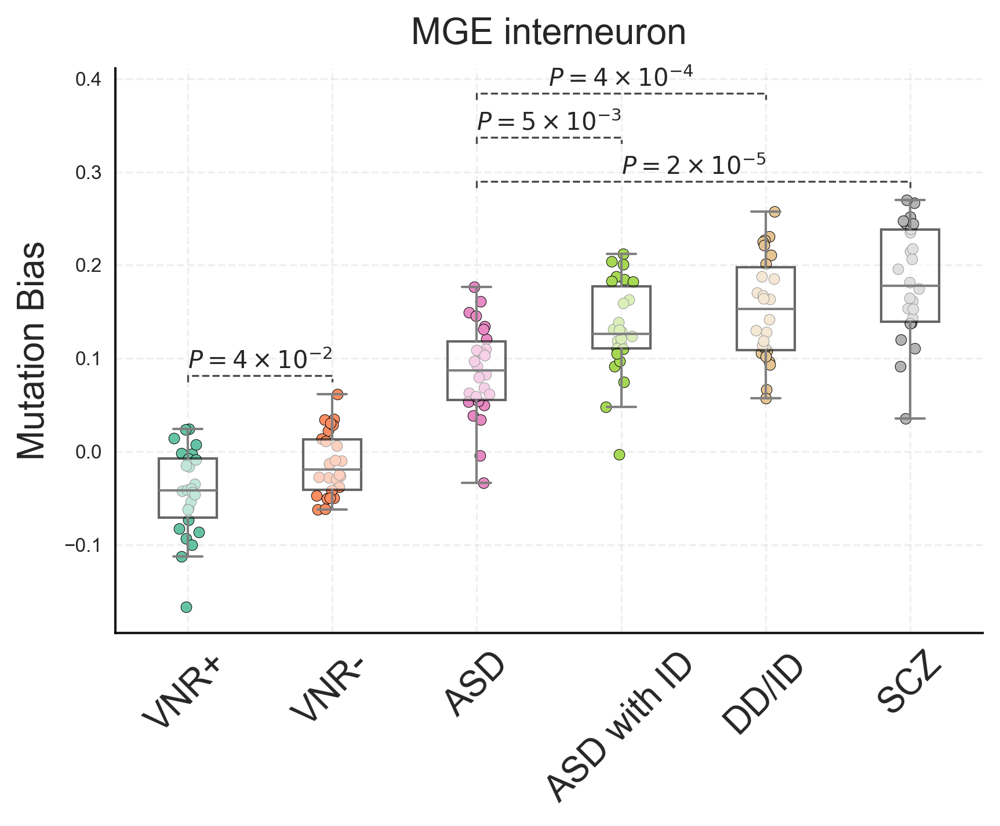

In [128]:
SuperCluster = "MGE interneuron"
plot_mutation_bias_comparison_V2(SuperCluster, datasets, Anno, all_contrasts_df, TestPairs=Test)

??? 0.00012128420792797517
???? 0.00012128420792797517
VNR+ vs VNR-: $P = 1 \times 10^{-4}$
???? 0.00012128420792797517
??? 0.0009659345371448744
???? 0.0009659345371448744
ASD vs SCZ: $P = 10 \times 10^{-4}$
???? 0.0009659345371448744
??? 0.001520251421225706
???? 0.001520251421225706
ASD vs ASD with ID: $P = 2 \times 10^{-3}$
???? 0.001520251421225706
??? 0.00018192631189196276
???? 0.00018192631189196276
ASD vs DD/ID: $P = 2 \times 10^{-4}$
???? 0.00018192631189196276


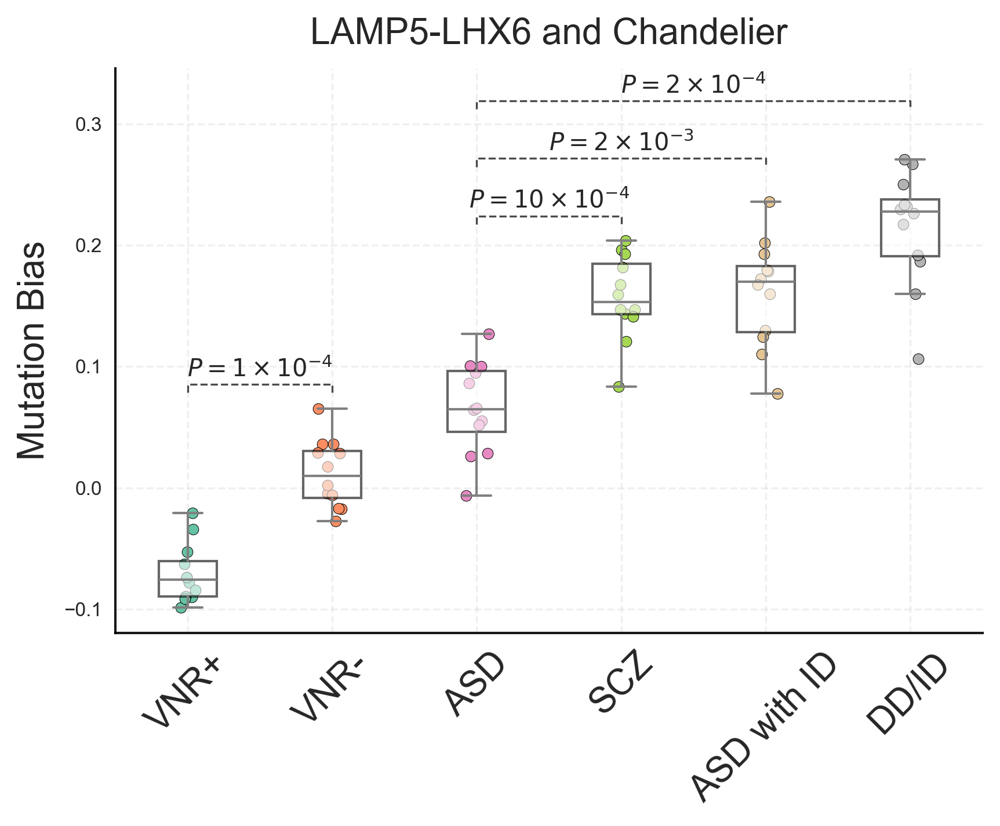

In [129]:
SuperCluster = "LAMP5-LHX6 and Chandelier"
plot_mutation_bias_comparison_V2(SuperCluster, datasets, Anno, all_contrasts_df, TestPairs=Test)

???? 1.189325951640947e-06
???? 7.944360588326353e-05
???? 1.7942567552878242e-08
???? 8.457781060500601e-05


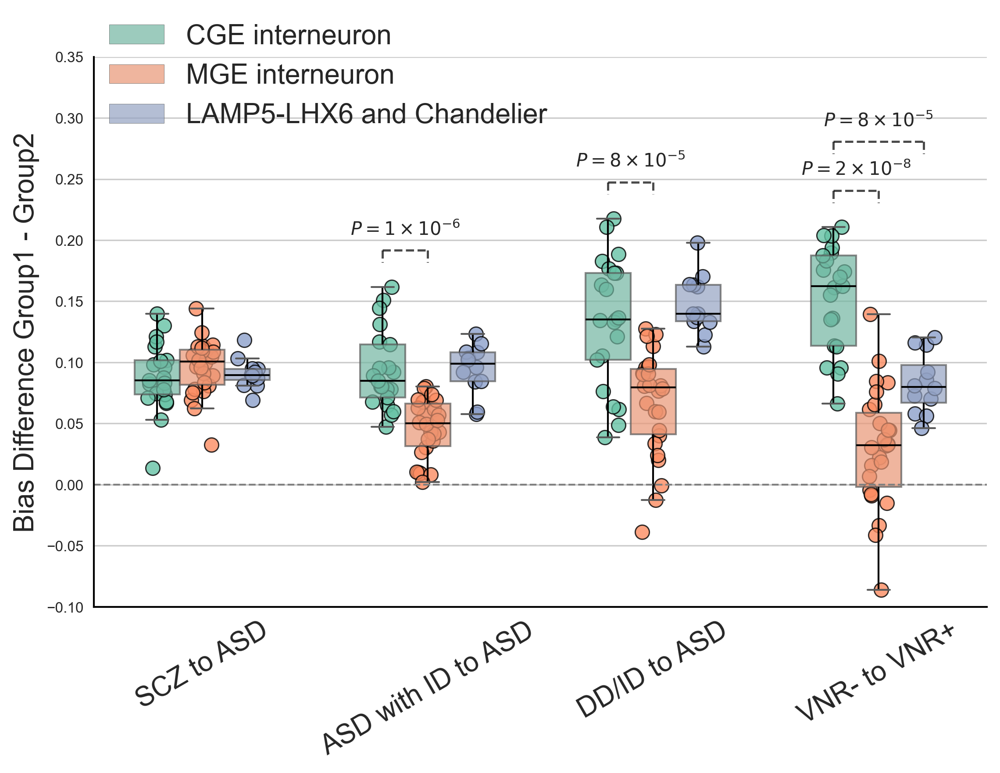

,DisorderPair,Test,CGE_median,MGE_median,MWU_stat,MWU_pval,LAMP5_median
0,SCZ to ASD,CGE > MGE,0.085150,0.100673,217.0,8.866663e-01,NaN
1,SCZ to ASD,CGE > LAMP5,0.085150,NaN,115.0,6.665392e-01,0.089591
2,ASD with ID to ASD,CGE > MGE,0.084874,0.050271,494.0,1.189326e-06,NaN
3,ASD with ID to ASD,CGE > LAMP5,0.084874,NaN,107.0,7.672344e-01,0.099027
4,DD/ID to ASD,CGE > MGE,0.135017,0.079548,450.0,7.944361e-05,NaN
5,DD/ID to ASD,CGE > LAMP5,0.135017,NaN,110.0,7.315465e-01,0.139935
6,VNR- to VNR+,CGE > MGE,0.162462,0.032138,531.0,1.794257e-08,NaN
7,VNR- to VNR+,CGE > LAMP5,0.162462,NaN,227.0,8.457781e-05,0.079883


SCZ to ASD: CGE median diff = 0.0852, MGE median diff = 0.1007 | MWU p=0.887
SCZ to ASD: CGE median diff = 0.0852, LAMP5 median diff = 0.0896 | MWU p=0.667
ASD with ID to ASD: CGE median diff = 0.0849, MGE median diff = 0.0503 | MWU p=1.19e-06
ASD with ID to ASD: CGE median diff = 0.0849, LAMP5 median diff = 0.0990 | MWU p=0.767
DD/ID to ASD: CGE median diff = 0.1350, MGE median diff = 0.0795 | MWU p=7.94e-05
DD/ID to ASD: CGE median diff = 0.1350, LAMP5 median diff = 0.1399 | MWU p=0.732
VNR- to VNR+: CGE median diff = 0.1625, MGE median diff = 0.0321 | MWU p=1.79e-08
VNR- to VNR+: CGE median diff = 0.1625, LAMP5 median diff = 0.0799 | MWU p=8.46e-05


In [117]:

# Datasets mapping
datasets = {
    'ASD': HighIQ_ASD_Bias,
    'ASD with ID': LowIQ_ASD_Bias,
    'VNR+': VNR_Pos_Bias,
    'VNR-': VNR_Neg_Bias,
    'DD/ID': DDD_Bias,
    'SCZ': SCZ_Bias
}

superclusters = ["CGE interneuron", "MGE interneuron", "LAMP5-LHX6 and Chandelier"]
# Swap all pairs (ASD SCZ to SCZ ASD, etc.)
disorder_pairs = [
    ("SCZ", "ASD"),
    ("ASD with ID", "ASD"),
    ("DD/ID", "ASD"),
    ("VNR-", "VNR+"),
]

# Helper: convert disorder pair tuple to label for plotting (use " to " instead of "-")
def disorderpair_label(d1, d2):
    return f"{d1} to {d2}"

# 1. For each disorder pair, for each cluster in each supercluster, compute bias diff (EFFECT in group1 - EFFECT in group2)
#    and store all individual cluster-level bias diffs for plotting
all_biasdiffs = []
for d1, d2 in disorder_pairs:
    for sc in superclusters:
        # Get all clusters in this supercluster present in both datasets
        clusters1 = datasets[d1].loc[datasets[d1]["Supercluster"] == sc].index.values
        clusters2 = datasets[d2].loc[datasets[d2]["Supercluster"] == sc].index.values
        common_clusters = set(clusters1).intersection(set(clusters2))
        for clust in common_clusters:
            val1 = datasets[d1].loc[(datasets[d1]["Supercluster"] == sc)].loc[[clust], "EFFECT"]
            val2 = datasets[d2].loc[(datasets[d2]["Supercluster"] == sc)].loc[[clust], "EFFECT"]
            # Only if both have a value
            if not val1.empty and not val2.empty:
                biasdiff = val1.values[0] - val2.values[0]
                all_biasdiffs.append({
                    "DisorderPair": disorderpair_label(d1, d2),
                    "Supercluster": sc,
                    "Cluster": clust,
                    "BiasDiff": biasdiff
                })

plot_df = pd.DataFrame(all_biasdiffs)

if plot_df.empty:
    print("No cluster-level bias differences found for the specified disorder pairs and superclusters.")
else:
    # 2. Plot: For each disorder pair, show boxplot for each supercluster (Y = bias diff), with all cluster-level points

    import matplotlib.patches as mpatches

    # Prepare order and hue_order for consistent plotting
    disorderpair_order = [disorderpair_label(d1, d2) for d1, d2 in disorder_pairs]
    supercluster_order = superclusters

    # Set up the figure and axes with transparent background
    fig, ax = plt.subplots(figsize=(8, 6), dpi=300, facecolor='none')
    fig.patch.set_alpha(0.0)
    ax.set_facecolor('none')

    # --- Set up consistent color palette for both boxplot and scatter ---
    palette = sns.color_palette("Set2", len(supercluster_order))
    color_dict = dict(zip(supercluster_order, palette))

    # Draw the boxplot (no data dots), with consistent colors
    sns.boxplot(
        data=plot_df,
        x="DisorderPair",
        y="BiasDiff",
        hue="Supercluster",
        order=disorderpair_order,
        hue_order=supercluster_order,
        dodge=True,
        showfliers=False,
        width=0.6,
        boxprops=dict(alpha=0.7),
        medianprops={"color": "black"},
        whiskerprops={"color": "black"},
        ax=ax,
        palette=color_dict  # ensure consistent color
    )

    # --- Calculate the positions of each box for each (DisorderPair, Supercluster) ---
    n_pairs = len(disorderpair_order)
    n_super = len(supercluster_order)
    xticks = np.arange(n_pairs)
    width = 0.6
    total_width = width
    each_width = total_width / n_super
    offsets = np.linspace(-total_width/2 + each_width/2, total_width/2 - each_width/2, n_super)
    pos_dict = {}
    for i, dp in enumerate(disorderpair_order):
        for j, sc in enumerate(supercluster_order):
            pos_dict[(dp, sc)] = xticks[i] + offsets[j]

    # --- Plot the individual cluster points, aligned with the boxes, using the same color as boxplot ---
    for (dp, sc), group in plot_df.groupby(["DisorderPair", "Supercluster"]):
        x = pos_dict[(dp, sc)]
        y = group["BiasDiff"].values
        jitter = np.random.uniform(-each_width/4, each_width/4, size=len(y))
        ax.scatter(
            np.full_like(y, x) + jitter,
            y,
            color=color_dict[sc],
            edgecolor="black",
            alpha=0.8,
            linewidth=0.7,
            s=60,
            label=None
        )

    ax.set_ylabel("Bias Difference Group1 - Group2", fontsize=15)
    ax.set_xlabel("")
    ax.axhline(0, color='gray', linestyle='--', linewidth=1)
    ax.set_xticks(xticks)
    ax.set_xticklabels(disorderpair_order, rotation=30, fontsize=15)
    plt.tight_layout()

    # --- Strengthen left and bottom axes, hide top and right ---
    ax.spines['left'].set_linewidth(1)
    ax.spines['bottom'].set_linewidth(1)
    ax.spines['left'].set_color('black')
    ax.spines['bottom'].set_color('black')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # 3. Annotate p-values for each comparison (CGE vs MGE, CGE vs LAMP5) for each disorder pair
    test_results = []
    cap_height = 0.01  # height of the vertical cap/tick
    for i, dp in enumerate(disorderpair_order):
        cge_diffs = plot_df[(plot_df["DisorderPair"] == dp) & (plot_df["Supercluster"] == "CGE interneuron")]["BiasDiff"].values
        mge_diffs = plot_df[(plot_df["DisorderPair"] == dp) & (plot_df["Supercluster"] == "MGE interneuron")]["BiasDiff"].values
        lamp_diffs = plot_df[(plot_df["DisorderPair"] == dp) & (plot_df["Supercluster"] == "LAMP5-LHX6 and Chandelier")]["BiasDiff"].values

        # CGE vs MGE
        if len(cge_diffs) > 0 and len(mge_diffs) > 0:
            stat, pval = mannwhitneyu(cge_diffs, mge_diffs, alternative='greater')
            test_results.append({
                "DisorderPair": dp,
                "Test": "CGE > MGE",
                "CGE_median": np.median(cge_diffs),
                "MGE_median": np.median(mge_diffs),
                "MWU_stat": stat,
                "MWU_pval": pval
            })
            if pval < 0.05:
                x1 = pos_dict[(dp, "CGE interneuron")]
                x2 = pos_dict[(dp, "MGE interneuron")]
                y_max = max(
                    np.max(cge_diffs) if len(cge_diffs) > 0 else 0,
                    np.max(mge_diffs) if len(mge_diffs) > 0 else 0
                )
                y = y_max + 0.03
                ax.plot([x1, x2], [y, y], color='k', lw=1.2, zorder=10, ls='--', alpha=0.7)
                ax.plot([x1, x1], [y, y - cap_height], color='k', lw=1.2, zorder=10, ls='--', alpha=0.7)
                ax.plot([x2, x2], [y, y - cap_height], color='k', lw=1.2, zorder=10, ls='--', alpha=0.7)
                ax.text((x1 + x2)/2, y + 0.01, f"{format_pval_scientific(pval)}", ha='center', va='bottom', fontsize=10, zorder=11)

        # CGE vs LAMP5
        if len(cge_diffs) > 0 and len(lamp_diffs) > 0:
            stat, pval = mannwhitneyu(cge_diffs, lamp_diffs, alternative='greater')
            test_results.append({
                "DisorderPair": dp,
                "Test": "CGE > LAMP5",
                "CGE_median": np.median(cge_diffs),
                "LAMP5_median": np.median(lamp_diffs),
                "MWU_stat": stat,
                "MWU_pval": pval
            })
            if pval < 0.05:
                x1 = pos_dict[(dp, "CGE interneuron")]
                x2 = pos_dict[(dp, "LAMP5-LHX6 and Chandelier")]
                y_max = max(
                    np.max(cge_diffs) if len(cge_diffs) > 0 else 0,
                    np.max(lamp_diffs) if len(lamp_diffs) > 0 else 0
                )
                y = y_max + 0.07
                ax.plot([x1, x2], [y, y], color='k', lw=1.2, zorder=10, ls='--', alpha=0.7)
                ax.plot([x1, x1], [y, y - cap_height], color='k', lw=1.2, zorder=10, ls='--', alpha=0.7)
                ax.plot([x2, x2], [y, y - cap_height], color='k', lw=1.2, zorder=10, ls='--', alpha=0.7)
                ax.text((x1 + x2)/2, y + 0.01, f"{format_pval_scientific(pval)}", ha='center', va='bottom', fontsize=10, zorder=11)
    plt.tight_layout()

    # Remove duplicate legends and set legend title
    handles, labels = ax.get_legend_handles_labels()
    seen = set()
    new_handles = []
    new_labels = []
    for h, l in zip(handles, labels):
        if l not in seen and l in supercluster_order:
            new_handles.append(h)
            new_labels.append(l)
            seen.add(l)
    ax.legend(new_handles, new_labels, loc='upper left', bbox_to_anchor=(0.005, 1.08), borderaxespad=0., fontsize=15)
    plt.ylim(-0.1, 0.35)
    plt.show()

    # Show test results as a DataFrame
    test_df = pd.DataFrame(test_results)
    display(test_df)

    for idx, row in test_df.iterrows():
        if row['Test'] == "CGE > MGE":
            comp_median = row['MGE_median']
            comp_label = "MGE"
        else:
            comp_median = row['LAMP5_median']
            comp_label = "LAMP5"
        print(f"{row['DisorderPair']}: CGE median diff = {row['CGE_median']:.4f}, {comp_label} median diff = {comp_median:.4f} | MWU p={row['MWU_pval']:.3g}")


### VIP 

In [31]:
#ExpL = pd.read_csv("/home/jw3514/Work/CellType_Psy/dat/HumanCTExpressionMats/Human.Cluster.Log2Mean.Exp.csv", index_col=0)
ExpL = pd.read_csv("/home/jw3514/Work/CellType_Psy/dat/HumanCTExpressionMats/Human.CT.Exp.Entrez.csv", index_col=0)
ExpL.columns = [int(x) for x in ExpL.columns.values ]

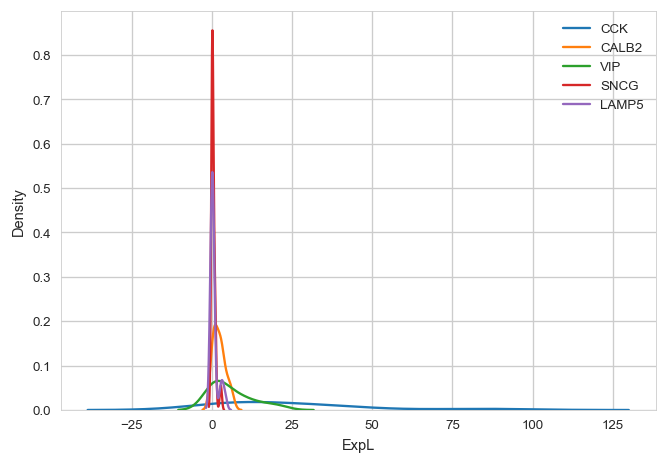

In [32]:
CGE_idx = Anno[Anno["Supercluster"]=="CGE interneuron"].index.values
CT = CGE_idx
PVALB_expl = ExpL.loc[GeneSymbol2Entrez["PVALB"], CT] 
CCK_expl = ExpL.loc[GeneSymbol2Entrez["CCK"], CT]
CALB2_expl = ExpL.loc[GeneSymbol2Entrez["CALB2"], CT]
SST_expl = ExpL.loc[GeneSymbol2Entrez["SST"], CT]
VIP_expl = ExpL.loc[GeneSymbol2Entrez["VIP"], CT]
SNCG_expl = ExpL.loc[GeneSymbol2Entrez["SNCG"], CT]
LAMP5_expl = ExpL.loc[GeneSymbol2Entrez["LAMP5"], CT]

plt.figure(dpi=120)
#sns.kdeplot(PVALB_expl, label="PVALB")
sns.kdeplot(CCK_expl, label="CCK")
sns.kdeplot(CALB2_expl, label="CALB2")
#sns.kdeplot(SST_expl, label="SST")
sns.kdeplot(VIP_expl, label="VIP")
sns.kdeplot(SNCG_expl, label="SNCG")
sns.kdeplot(LAMP5_expl, label="LAMP5")
plt.xlabel("ExpL")
plt.legend()

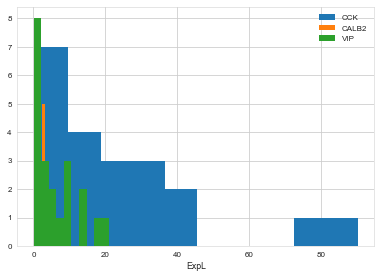

In [33]:
plt.hist(CCK_expl, label="CCK")
plt.hist(CALB2_expl, label="CALB2")
#sns.kdeplot(SST_expl, label="SST")
plt.hist(VIP_expl, label="VIP")
plt.xlabel("ExpL")
plt.legend()

In [34]:
GABA_ALL = Anno[(Anno["Supercluster"]=="CGE interneuron")]
GABA_ALL_idx = GABA_ALL.index.values

Name1="HIQ ASD"
Name2="22q.11"
index = []
PV = []
SST = []
VIP = []
CCK = []
GABA = []
CR = []
BiasA = []
BiasB = []
BiasC = []
Bias4 = []
Bias5 = []
Bias6 = []
Bias7 = []
for idx in GABA_ALL_idx:
    PV.append(ExpL.loc[GeneSymbol2Entrez["PVALB"], idx] )
    SST.append(ExpL.loc[GeneSymbol2Entrez["SST"], idx] )
    VIP.append(ExpL.loc[GeneSymbol2Entrez["VIP"], idx] )
    CCK.append(ExpL.loc[GeneSymbol2Entrez["CCK"], idx] )
    GABA.append(ExpL.loc[GeneSymbol2Entrez["SLC32A1"], idx] )
    CR.append(ExpL.loc[GeneSymbol2Entrez["CALB2"], idx] )

    BiasA.append(HighIQ_ASD_Bias.loc[idx, "EFFECT"])
    BiasB.append(X22q_Bias.loc[idx, "EFFECT"])
    BiasC.append(SCZ_Bias.loc[idx, "EFFECT"])
    Bias4.append(VNR_Neg_Bias.loc[idx, "EFFECT"])
    Bias5.append(DDD_Bias.loc[idx, "EFFECT"])
    Bias6.append(LowIQ_ASD_Bias.loc[idx, "EFFECT"])
    Bias7.append(EDU_Neg_Bias.loc[idx, "EFFECT"])
tmpdf = pd.DataFrame({"Index":GABA_ALL_idx, "PV":PV, "SST":SST, "VIP":VIP, "CCK":CCK, "GABA":GABA, 
                      "CR":CR,
                      "EFFECT_"+Name1:BiasA, 
                      "EFFECT_"+Name2:BiasB,
                      "EFFECT_SCZ":BiasC,
                      "EFFECT_VNR":Bias4,
                      "EFFECT_DD":Bias5,
                      "EFFECT_LIQ":Bias6,
                      "EFFECT_EDU":Bias7,
                     })
tmpdf = tmpdf.set_index("Index")

In [35]:
tmpdf

,PV,SST,VIP,CCK,GABA,CR,EFFECT_HIQ ASD,EFFECT_22q.11,EFFECT_SCZ,EFFECT_VNR,EFFECT_DD,EFFECT_LIQ,EFFECT_EDU
Index,,,,,,,,,,,,,
276,0.004808,0.805288,8.779327,24.634615,0.914423,0.432692,0.119685,0.069572,0.186497,0.073826,0.168487,0.236585,0.111171
277,0.005455,0.162424,0.045455,2.483636,1.015151,1.058788,0.105890,0.040994,0.188444,0.057970,0.182386,0.197931,0.171414
278,0.007385,1.052111,0.081232,45.028008,0.681064,0.451999,0.117516,0.013591,0.219342,0.046976,0.252533,0.195617,0.170949
279,0.012493,0.159457,2.963595,90.443985,0.822407,1.023106,0.126929,0.149702,0.200730,0.079258,0.188649,0.205152,0.081716
280,0.015276,0.081277,1.858206,78.125930,0.666079,1.327654,0.117004,0.149726,0.191434,0.016876,0.222487,0.181741,0.110251
281,0.010295,0.102059,4.373322,33.676365,0.689346,2.556849,0.130123,0.149497,0.226198,0.094774,0.168708,0.177562,0.128427
282,0.065673,0.440536,0.197715,29.134228,0.512966,0.486140,0.090096,0.098372,0.103706,0.041757,0.223230,0.147042,0.148714
283,0.010624,1.174502,0.125517,2.032437,0.596841,2.818165,0.090231,0.093752,0.161109,0.103370,0.211347,0.150215,0.145267
284,0.009551,0.463717,5.386541,0.769239,0.667362,3.823691,0.098188,0.121431,0.185662,0.079416,0.232545,0.212908,0.080222


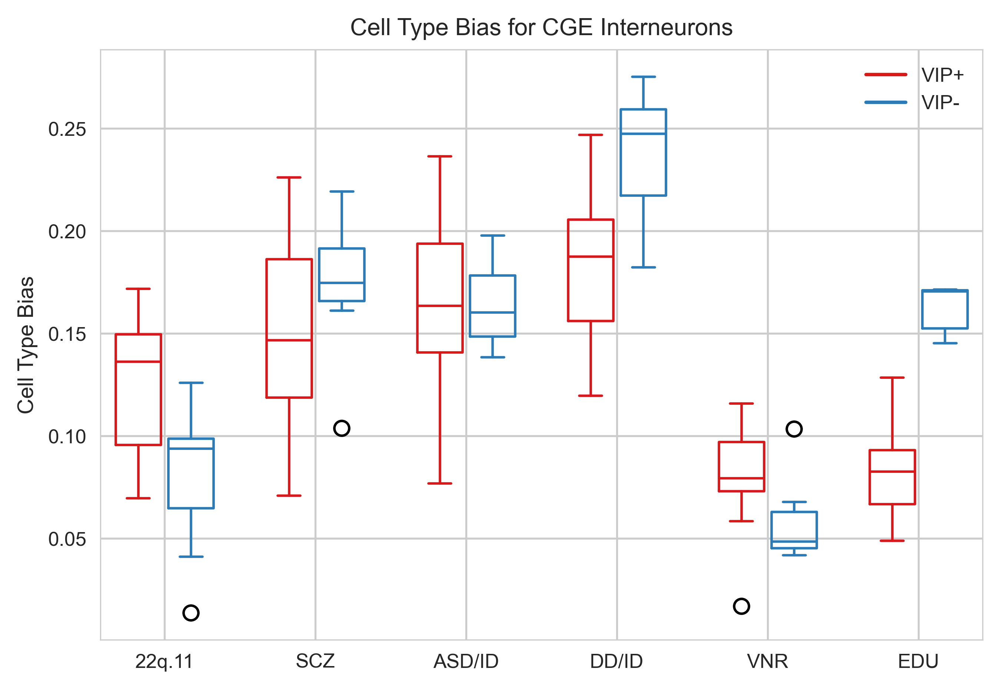

In [36]:
import matplotlib.pyplot as plt
 
# import the numpy package
import numpy as np
 
# create 2 - sample a 3-Dim array, that measures
# the summer and winter rain fall amount
VIP1 = [tmpdf[tmpdf["VIP"]>1]["EFFECT_22q.11"], 
               tmpdf[tmpdf["VIP"]>1]["EFFECT_SCZ"],
               tmpdf[tmpdf["VIP"]>1]["EFFECT_LIQ"],
               tmpdf[tmpdf["VIP"]>1]["EFFECT_DD"],
               tmpdf[tmpdf["VIP"]>1]["EFFECT_VNR"],
               tmpdf[tmpdf["VIP"]>1]["EFFECT_EDU"]]

VIP2 = [tmpdf[tmpdf["VIP"]<1]["EFFECT_22q.11"], 
               tmpdf[tmpdf["VIP"]<1]["EFFECT_SCZ"],
               tmpdf[tmpdf["VIP"]<1]["EFFECT_LIQ"],
               tmpdf[tmpdf["VIP"]<1]["EFFECT_DD"],
               tmpdf[tmpdf["VIP"]<1]["EFFECT_VNR"],
               tmpdf[tmpdf["VIP"]<1]["EFFECT_EDU"]]
 
# the list named ticks, summarizes or groups
# the summer and winter rainfall as low, mid
# and high
ticks = ['22q.11', 'SCZ', 'ASD/ID', 'DD/ID', "VNR", "EDU"]
 
plt.figure(dpi=480)
summer_rain_plot = plt.boxplot(VIP1,
                               positions=np.array(
    np.arange(len(VIP1)))*2.0-0.35, 
                               widths=0.6)
winter_rain_plot = plt.boxplot(VIP2,
                               positions=np.array(
    np.arange(len(VIP2)))*2.0+0.35,
                               widths=0.6)
 
def define_box_properties(plot_name, color_code, label):
    for k, v in plot_name.items():
        plt.setp(plot_name.get(k), color=color_code)
    plt.plot([], c=color_code, label=label)
    plt.legend()
 
 
# setting colors for each groups
define_box_properties(summer_rain_plot, '#D7191C', 'VIP+')
define_box_properties(winter_rain_plot, '#2C7BB6', 'VIP-')
 
# set the x label values
plt.xticks(np.arange(0, len(ticks) * 2, 2), ticks)
plt.ylabel("Cell Type Bias")
# set the limit for x axis
#plt.xlim(-2, len(ticks)*2)
 
# set the limit for y axis
#plt.ylim(0, 50)
 
# set the title
plt.title('Cell Type Bias for CGE Interneurons')
plt.show()

In [ ]:
X22q_mousemodel = pd.read_csv(os.path.join(Bias_Save_Dir, "HCT.X22q.mousemodel.csv"), index_col=0)
X22q_Bias = pd.read_csv(os.path.join(Bias_Save_Dir, "HCT.X22q.addP.csv"), index_col=0)

### CGE IN compare to Other IN

In [38]:
X22q_Bias_CGE = X22q_Bias[X22q_Bias["Supercluster"]=="CGE interneuron"]
X22q_Bias_MGE = X22q_Bias[X22q_Bias["Supercluster"]=="MGE interneuron"]
X22q_Bias_LAMP5 = X22q_Bias[X22q_Bias["Supercluster"]=="LAMP5-LHX6 and Chandelier"]


???? 0.0033220934354579283
???? 0.010360835244186083
???? 1.183596497736194e-07


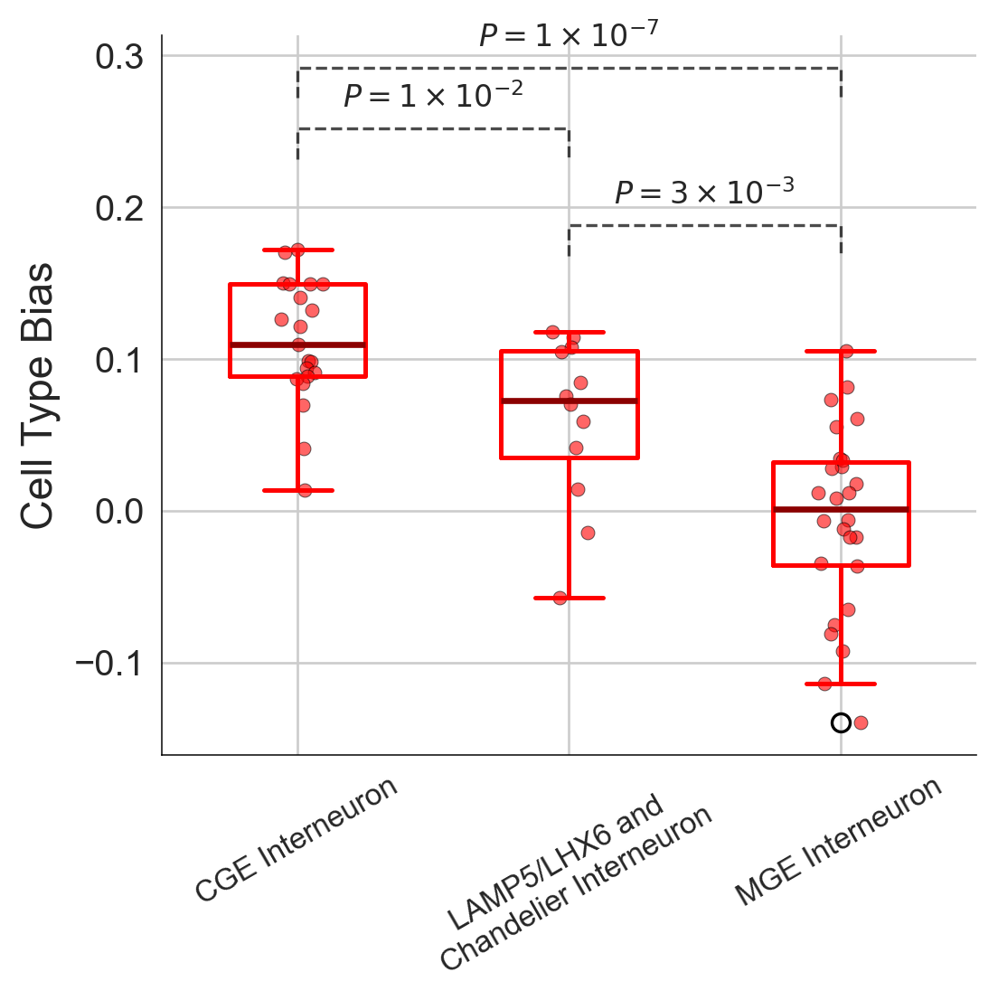

In [39]:
datasets = ['CGE Interneuron', 'LAMP5/LHX6 and \nChandelier Interneuron', 'MGE Interneuron']
labels = datasets

# Get data
dat = [X22q_Bias_CGE["EFFECT"], X22q_Bias_LAMP5["EFFECT"], X22q_Bias_MGE["EFFECT"]]

# Perform Mann-Whitney U tests between groups
stat_cge_lamp5, p_cge_lamp5 = mannwhitneyu(dat[0], dat[1])
stat_lamp5_mge, p_lamp5_mge = mannwhitneyu(dat[1], dat[2]) 
stat_cge_mge, p_cge_mge = mannwhitneyu(dat[0], dat[2])

# Create figure and axis
fig, ax = plt.subplots(figsize=(5,5), dpi=240, facecolor='none')
fig.patch.set_alpha(0.0)
ax.patch.set_alpha(0.0)

# Plot boxplots
pos_boxes = ax.boxplot(dat, positions=np.arange(len(datasets)), widths=0.5,
                       patch_artist=False,
                       boxprops=dict(color="red", linewidth=1.5),
                       medianprops=dict(color="darkred", linewidth=2),
                       whiskerprops=dict(color="red", linewidth=1.5),
                       capprops=dict(color="red", linewidth=1.5))

# Add data points
for i in range(len(datasets)):
    # Add jittered points
    x_pos = np.random.normal(i, 0.04, size=len(dat[i]))
    ax.scatter(x_pos, dat[i], color='red', alpha=0.6, s=20, edgecolor='k', linewidth=0.3)

# Add significance bars between groups
# Find the max for each group for more precise placement
y_maxes = [max(d) for d in dat]
h = 0.02


# Calculate y positions for bars
y_lamp5_mge = max(y_maxes[1], y_maxes[2]) + 0.05  # bottom
y_cge_lamp5 = max(y_maxes[0], y_maxes[1]) + 0.06  # middle
y_cge_mge = max(y_maxes[0], y_maxes[2]) + 0.10    # top

# LAMP5 to MGE (bottom)
ax.plot([1, 1, 2, 2], [y_lamp5_mge, y_lamp5_mge+h, y_lamp5_mge+h, y_lamp5_mge], linewidth=1.0, ls='--', alpha=0.7, color='black')
ax.text(1.5, y_lamp5_mge + h + 0.01, format_pval_scientific(p_lamp5_mge), ha='center', va='bottom', fontsize=10)

# CGE to LAMP5 (middle)
ax.plot([0, 0, 1, 1], [y_cge_lamp5, y_cge_lamp5+h, y_cge_lamp5+h, y_cge_lamp5], linewidth=1.0, ls='--', alpha=0.7, color='black')
ax.text(0.5, y_cge_lamp5 + h + 0.01, format_pval_scientific(p_cge_lamp5), ha='center', va='bottom', fontsize=10)

# CGE to MGE (top)
ax.plot([0, 0, 2, 2], [y_cge_mge, y_cge_mge+h, y_cge_mge+h, y_cge_mge], linewidth=1.0, ls='--', alpha=0.7, color='black') 
ax.text(1, y_cge_mge + h + 0.01, format_pval_scientific(p_cge_mge), ha='center', va='bottom', fontsize=10)

# Customize plot
ax.set_xticks(range(len(labels)))
ax.set_xticklabels(labels, fontsize=10, fontweight='normal', rotation=30)
ax.tick_params(axis='y', labelsize=12)
ax.set_ylabel("Cell Type Bias", fontsize=14, fontweight='normal')

# Remove unnecessary spines for a cleaner look
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('black')
ax.spines['left'].set_alpha(0.9)
ax.spines['bottom'].set_color('black') 
ax.spines['bottom'].set_alpha(0.9)


plt.tight_layout()
plt.show()


### VIP+ vs VIP- 

In [ ]:
GABA_ALL = Anno[(Anno["Supercluster"]=="CGE interneuron")]
GABA_ALL_idx = GABA_ALL.index.values

index = []
PV = []
SST = []
VIP = []
CCK = []
GABA = []
CR = []
BiasA = []
BiasB = []

for idx in GABA_ALL_idx:
    PV.append(ExpL.loc[GeneSymbol2Entrez["PVALB"], idx])
    SST.append(ExpL.loc[GeneSymbol2Entrez["SST"], idx])
    VIP.append(ExpL.loc[GeneSymbol2Entrez["VIP"], idx])
    CCK.append(ExpL.loc[GeneSymbol2Entrez["CCK"], idx])
    GABA.append(ExpL.loc[GeneSymbol2Entrez["SLC32A1"], idx])
    CR.append(ExpL.loc[GeneSymbol2Entrez["CALB2"], idx])

    BiasA.append(X22q_Bias.loc[idx, "EFFECT"])
    BiasB.append(X22q_mousemodel.loc[idx, "EFFECT"])

tmpdf2 = pd.DataFrame({
    "Index": GABA_ALL_idx,
    "PV": PV,
    "SST": SST, 
    "VIP": VIP,
    "CCK": CCK,
    "GABA": GABA,
    "CR": CR,
    "EFFECT_22q.11": BiasA,
    "EFFECT_22q.11_mouse_gene": BiasB
})

In [41]:
cutoff = 1.0
CGE_VIP_Pos = tmpdf2[tmpdf2["VIP"] >= cutoff]["Index"].values
CGE_VIP_Neg = tmpdf2[tmpdf2["VIP"] <  cutoff]["Index"].values
# output the list of genes to file
with open("../dat/Other/CGE_VIP_Pos.txt", "w") as f:
    for gene in CGE_VIP_Pos:
        # Convert gene to string before concatenating with newline
        f.write(str(gene) + "\n")
with open("../dat/Other/CGE_VIP_Neg.txt", "w") as f:
    for gene in CGE_VIP_Neg:
        # Convert gene to string before concatenating with newline 
        f.write(str(gene) + "\n")

???? 0.03787409700722394
???? 0.012469900240798073


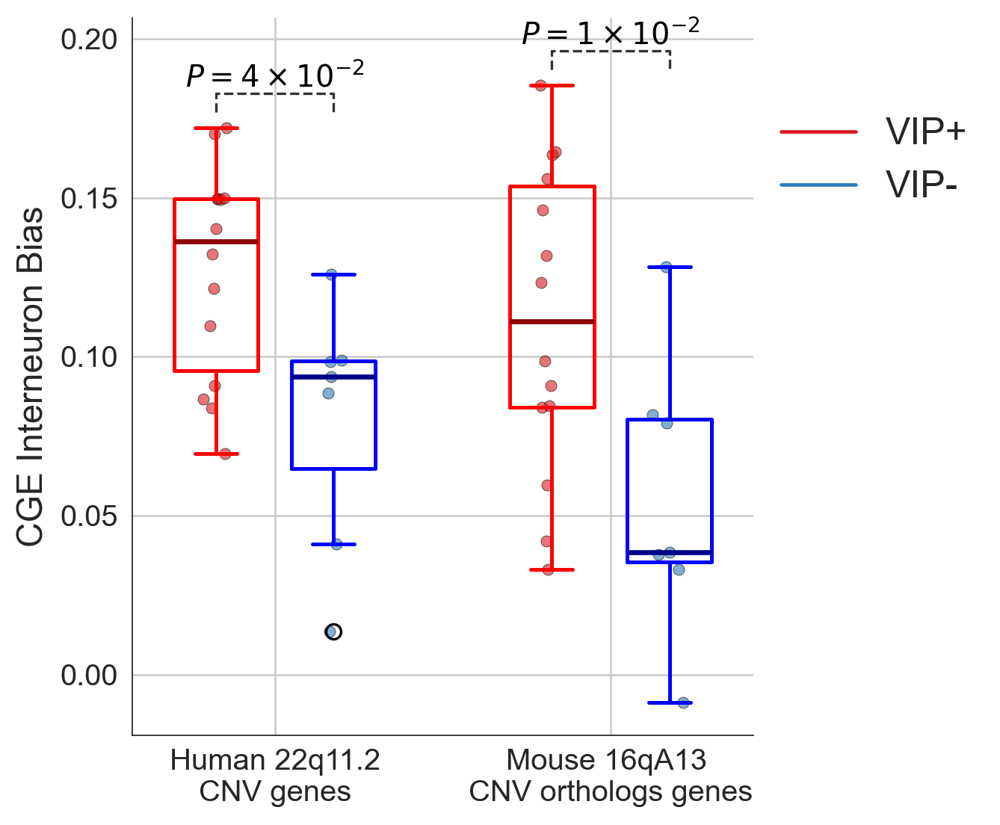

In [42]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

cutoff = 1.0

# Sample data
VIP1 = [tmpdf2[tmpdf2["VIP"] >= cutoff]["EFFECT_22q.11"],
        tmpdf2[tmpdf2["VIP"] >= cutoff]["EFFECT_22q.11_mouse_gene"],
]

VIP2 = [tmpdf2[tmpdf2["VIP"] < cutoff]["EFFECT_22q.11"],
        tmpdf2[tmpdf2["VIP"] < cutoff]["EFFECT_22q.11_mouse_gene"],
]

# Labels
#ticks = ['22q11.2 \ngenes', '16qA13\n mouse genes']
ticks = ['Human 22q11.2\nCNV genes', 'Mouse 16qA13 \nCNV orthologs genes']

# Create the figure with enhanced DPI for publication quality
fig, ax = plt.subplots(figsize=(6,5), dpi=240, facecolor='none')
fig.patch.set_alpha(0.0)
ax.patch.set_alpha(0.0)

# Boxplot for VIP+ and VIP- groups with specific properties
summer_rain_plot = ax.boxplot(
    VIP1,
    positions=np.array(np.arange(len(VIP1)))*2.0-0.35,
    widths=0.5, patch_artist=False,
    boxprops=dict(color="red", linewidth=1.5),
    medianprops=dict(color="darkred", linewidth=2),
    whiskerprops=dict(color="red", linewidth=1.5),
    capprops=dict(color="red", linewidth=1.5)
)

winter_rain_plot = ax.boxplot(
    VIP2,
    positions=np.array(np.arange(len(VIP2)))*2.0+0.35,
    widths=0.5, patch_artist=False,
    boxprops=dict(color="blue", linewidth=1.5),
    medianprops=dict(color="darkblue", linewidth=2),
    whiskerprops=dict(color="blue", linewidth=1.5),
    capprops=dict(color="blue", linewidth=1.5)
)

# Function to define and style boxplot properties
def define_box_properties(ax, color_code, label):
    ax.plot([], c=color_code, label=label)
    # Place legend to the right of the figure, outside plot area
    ax.legend(frameon=False, fontsize=15, loc='center left', bbox_to_anchor=(1.02, 0.8), borderaxespad=0)

# Apply colors and labels
define_box_properties(ax, '#D7191C', 'VIP+')
define_box_properties(ax, '#2C7BB6', 'VIP-')

# Plot individual data points with jitter and transparency
for i in range(len(VIP1)):
    x1 = np.random.normal(i*2.0-0.35, 0.04, size=len(VIP1[i]))  # VIP+ jittered positions
    x2 = np.random.normal(i*2.0+0.35, 0.04, size=len(VIP2[i]))  # VIP- jittered positions
    ax.scatter(x1, VIP1[i], color='#D7191C', alpha=0.6, s=20, edgecolor='k', linewidth=0.3)
    ax.scatter(x2, VIP2[i], color='#2C7BB6', alpha=0.6, s=20, edgecolor='k', linewidth=0.3)

    # Adding p-values with bar just above the box, styled as in previous plot
    stat, p = mannwhitneyu(VIP1[i], VIP2[i])
    x1_box, x2_box = i*2.0-0.35, i*2.0+0.35  # positions of the boxes

    # Get the max y-value of the two boxes (whiskers)
    y1_max = summer_rain_plot['whiskers'][2*i+1].get_ydata()[1]
    y2_max = winter_rain_plot['whiskers'][2*i+1].get_ydata()[1]
    y = max(y1_max, y2_max) + 0.005
    h = 0.006  # 3% of y-range for bar height

    # Draw the bar just above the box, with same style as previous plot
    ax.plot([x1_box, x1_box, x2_box, x2_box], [y, y+h, y+h, y], lw=1.0, ls='dashed', alpha=0.8, color='black')
    ax.text((x1_box + x2_box) * .5, y + h, format_pval_scientific(p), ha='center', va='bottom', color='k', fontsize=12, fontweight='normal')

# Set x-ticks, labels, and adjust the layout for publication quality
ax.set_xticks(np.arange(0, len(ticks) * 2, 2))
ax.set_xticklabels(ticks, fontsize=12, fontweight='normal')
ax.tick_params(axis='y', labelsize=12)
ax.set_ylabel("CGE Interneuron Bias", fontsize=14, fontweight='normal')
#ax.set_ylim(-0.1, 0.75)
#ax.set_title("Cell Type Bias Across Different Gene Sets", fontsize=16, fontweight='bold')

# Remove unnecessary spines for a cleaner look
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('black')
ax.spines['left'].set_alpha(0.9)
ax.spines['bottom'].set_color('black') 
ax.spines['bottom'].set_alpha(0.9)

# Adjust layout to prevent clipping and improve overall appearance
fig.tight_layout()

# Show the plot
plt.show()


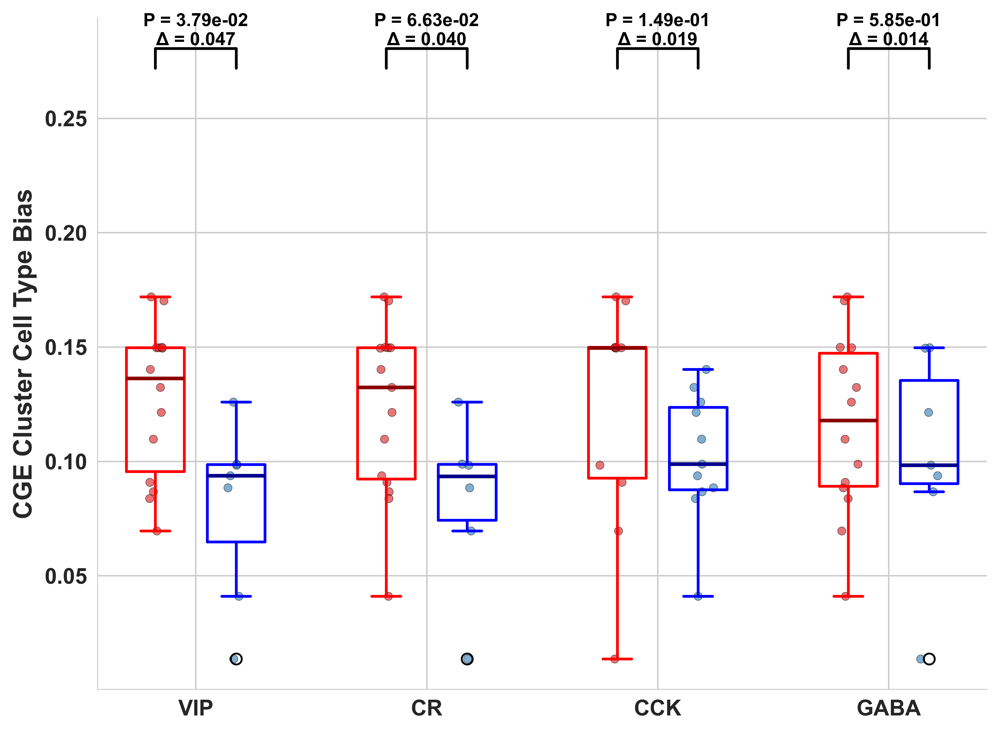

In [43]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

cutoff = 1.0

# Sample data
VIP1 = [tmpdf2[tmpdf2["VIP"] > cutoff]["EFFECT_22q.11"],
        tmpdf2[tmpdf2["CR"] > cutoff]["EFFECT_22q.11"],
        tmpdf2[tmpdf2["CCK"] > 20]["EFFECT_22q.11"],
        tmpdf2[tmpdf2["GABA"] > 0.7]["EFFECT_22q.11"],
        ]

VIP2 = [tmpdf2[tmpdf2["VIP"] < cutoff]["EFFECT_22q.11"], 
        tmpdf2[tmpdf2["CR"] < cutoff]["EFFECT_22q.11"], 
        tmpdf2[tmpdf2["CCK"] < 20]["EFFECT_22q.11"],
        tmpdf2[tmpdf2["GABA"] < 0.7]["EFFECT_22q.11"],
        ]

# Labels
ticks = ['VIP', 'CR', 'CCK', 'GABA']

# Create the figure with enhanced DPI for publication quality
plt.figure(dpi=600, figsize=(8, 6))

# Boxplot for VIP+ and VIP- groups with specific properties
summer_rain_plot = plt.boxplot(VIP1, 
                               positions=np.array(np.arange(len(VIP1)))*2.0-0.35, 
                               widths=0.5, patch_artist=False,
                               boxprops=dict(color="red", linewidth=1.5),
                               medianprops=dict(color="darkred", linewidth=2),
                               whiskerprops=dict(color="red", linewidth=1.5),
                               capprops=dict(color="red", linewidth=1.5))

winter_rain_plot = plt.boxplot(VIP2, 
                               positions=np.array(np.arange(len(VIP2)))*2.0+0.35, 
                               widths=0.5, patch_artist=False,
                               boxprops=dict(color="blue", linewidth=1.5),
                               medianprops=dict(color="darkblue", linewidth=2),
                               whiskerprops=dict(color="blue", linewidth=1.5),
                               capprops=dict(color="blue", linewidth=1.5))

# Function to define and style boxplot properties
def define_box_properties(plot_name, color_code, label):
    plt.plot([], c=color_code, label=label)
    plt.legend(frameon=False, fontsize=15, loc='upper left')


# Plot individual data points with jitter and transparency
for i in range(len(VIP1)):
    x1 = np.random.normal(i*2.0-0.35, 0.04, size=len(VIP1[i]))  # VIP+ jittered positions
    x2 = np.random.normal(i*2.0+0.35, 0.04, size=len(VIP2[i]))  # VIP- jittered positions
    plt.scatter(x1, VIP1[i], color='#D7191C', alpha=0.6, s=20, edgecolor='k', linewidth=0.3)
    plt.scatter(x2, VIP2[i], color='#2C7BB6', alpha=0.6, s=20, edgecolor='k', linewidth=0.3)

    # Calculate mean difference between groups
    mean_diff = np.mean(VIP1[i]) - np.mean(VIP2[i])
    
    # Adding p-values and mean difference with appropriate placement
    stat, p = mannwhitneyu(VIP1[i], VIP2[i])
    x1, x2 = i*2.0-0.35, i*2.0+0.35  # positions of the boxes
    y, h, col = max(max(VIP1[i]), max(VIP2[i])) + 0.1, max(max(VIP1[i]), max(VIP2[i])) * 0.05, 'k'
    plt.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
    plt.text((x1 + x2) * .5, y + h, f"P = {p:.2e}\nΔ = {mean_diff:.3f}", 
             ha='center', va='bottom', color=col, fontsize=10, fontweight='bold')

# Set x-ticks, labels, and adjust the layout for publication quality
plt.xticks(np.arange(0, len(ticks) * 2, 2), ticks, fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.ylabel("CGE Cluster Cell Type Bias", fontsize=14, fontweight='bold')

# Remove unnecessary spines for a cleaner look
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Adjust layout to prevent clipping and improve overall appearance
plt.tight_layout()

# Show the plot
plt.show()


### Sup Figures


In [44]:
ExpMat = pd.read_csv("/home/jw3514/Work/BrainDisorders/data/expression/brainspan/gene_matrix/gene_exp_avg2time.csv", index_col=0)
LogExpMat = np.log2(ExpMat+1)
qnLogExpMat = quantileNormalize(LogExpMat)
Meta = pd.read_csv("/home/jw3514/Work/BrainDisorders/data/expression/brainspan/gene_matrix/rows_metadata.csv", index_col=0)
Meta = Meta[~Meta["entrez_id"].isna()]
Meta["entrez_id"] = [int(x) for x in Meta["entrez_id"].values]

Time = ['mean_2A', 'mean_2B', 'mean_3A', 'mean_3B', 'mean_4', 'mean_5',
       'mean_6', 'mean_7', 'mean_8', 'mean_9', 'mean_10', 'mean_11']

In [ ]:
GeneWeightDIR = "../dat/GeneWeights/"

SCZ_Genes = pd.read_csv("{}/SCZ.top61.nopLI.LGD_Dmis_SameWeight.exclude_Mis2.gw".format(GeneWeightDIR), header=None)
SCZ_Genes = SCZ_Genes[0].values
HIQ_ASD_Genes = pd.read_csv("{}/HIQ.top61.nopLI.LGD_Dmis_SameWeight.gw".format(GeneWeightDIR), header=None)
HIQ_ASD_Genes = HIQ_ASD_Genes[0].values
LIQ_ASD_Genes = pd.read_csv("{}/LIQ.top61.nopLI.LGD_Dmis_SameWeight.gw".format(GeneWeightDIR), header=None)
LIQ_ASD_Genes = LIQ_ASD_Genes[0].values

SCZ_Idx = Meta[Meta["entrez_id"].isin(SCZ_Genes)].index
SCZ_Dat = qnLogExpMat.loc[SCZ_Idx, Time]
HIQASD_Idx = Meta[Meta["entrez_id"].isin(HIQ_ASD_Genes)].index
HIQASD_Dat = qnLogExpMat.loc[HIQASD_Idx, Time]
LIQASD_Idx = Meta[Meta["entrez_id"].isin(LIQ_ASD_Genes)].index
LIQASD_Dat = qnLogExpMat.loc[LIQASD_Idx, Time]

ALL_Dat = qnLogExpMat.loc[:, Time]

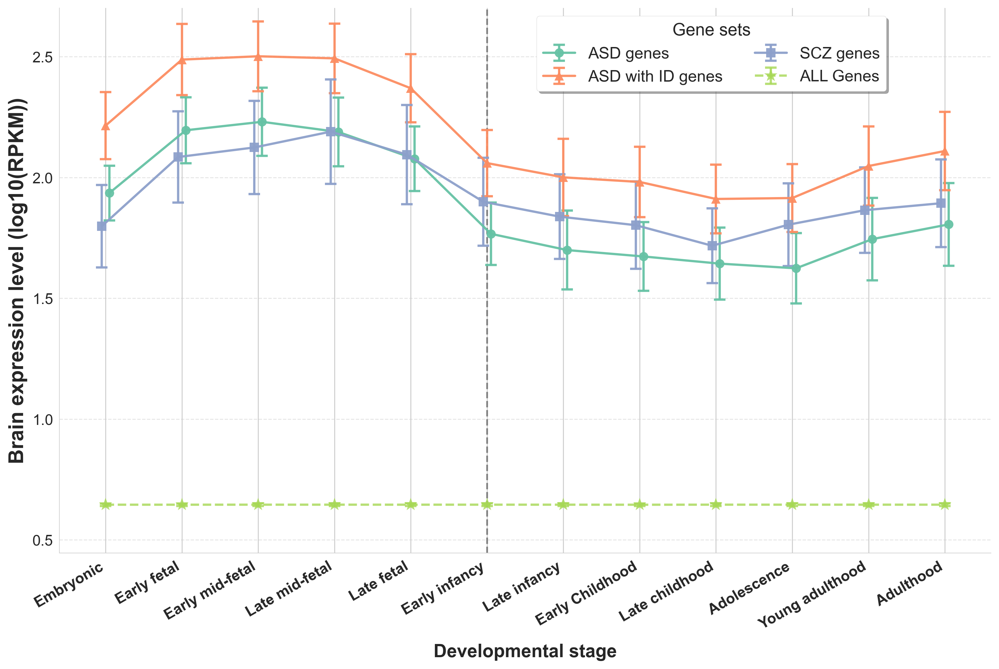

In [46]:
# Create a color palette
palette = sns.color_palette("Set2", 5)

# Create the figure and axis with a more square aspect and more space for labels/legend
fig, ax = plt.subplots(dpi=300, figsize=(12, 8), constrained_layout=True)

# Plotting the data with error bars, using larger markers and more separation
# Shift HIQASD profile slightly to the right to avoid error bar overlap
xvals = np.arange(len(HIQASD_Dat.columns.values))
shift = 0.05  # adjust as needed for visual separation
ax.errorbar(
    x=xvals + shift,
    y=HIQASD_Dat.mean(axis=0), 
    yerr=HIQASD_Dat.std(axis=0)/math.sqrt(HIQASD_Dat.shape[0]), 
    label="ASD genes", color=palette[0], marker='o', linewidth=2, markersize=8, alpha=0.95, zorder=3, capsize=5, elinewidth=2, capthick=2
)

ax.errorbar(
    x=LIQASD_Dat.columns.values,
    y=LIQASD_Dat.mean(axis=0), 
    yerr=LIQASD_Dat.std(axis=0)/math.sqrt(LIQASD_Dat.shape[0]), 
    label="ASD with ID genes", color=palette[1], marker='^', linewidth=2, markersize=8, alpha=0.95, zorder=3, capsize=5, elinewidth=2, capthick=2
)

xvals = np.arange(len(SCZ_Dat   .columns.values))
shift = - 0.05  # adjust as needed for visual separation
ax.errorbar(
    x=xvals + shift,
    y=SCZ_Dat.mean(axis=0), 
    yerr=SCZ_Dat.std(axis=0)/math.sqrt(SCZ_Dat.shape[0]), 
    label="SCZ genes", color=palette[2], marker='s', linewidth=2, markersize=8, alpha=0.95, zorder=3, capsize=5, elinewidth=2, capthick=2
)

# ax.errorbar(x=X22q_Dat.columns.values,
#             y=X22q_Dat.mean(axis=0), 
#             yerr=X22q_Dat.std(axis=0)/math.sqrt(X22q_Dat.shape[0]), 
#             label="22q.11 genes", color=palette[3], marker='D', capsize=4, linewidth=2)

ax.errorbar(
    x=ALL_Dat.columns.values,
    y=ALL_Dat.mean(axis=0), 
    yerr=ALL_Dat.std(axis=0)/math.sqrt(ALL_Dat.shape[0]), 
    label="ALL Genes", color=palette[4], ls="--", marker='*', linewidth=2, markersize=12, alpha=0.8, zorder=2, capsize=5, elinewidth=2, capthick=2
)

# Vertical line at x = 5 (after "Late fetal")
ax.axvline(x=5, color='grey', ls="--", linewidth=1.5, zorder=1)

# Customizing x-axis ticks
labels = [
    "Embryonic", "Early fetal", "Early mid-fetal", "Late mid-fetal", "Late fetal", 
    "Early infancy", "Late infancy", "Early Childhood", "Late childhood", "Adolescence",
    "Young adulthood", "Adulthood"
]
ax.set_xticks(HIQASD_Dat.columns.values)
ax.set_xticklabels(labels, rotation=30, ha='right', fontsize=13, weight='bold')

# Set y-axis label
ax.set_ylabel("Brain expression level (log10(RPKM))", fontsize=18, weight='bold')

# Set x-axis label
ax.set_xlabel("Developmental stage", fontsize=16, weight='bold', labelpad=10)

# Set y-axis limits with a little padding
ymin = min(
    HIQASD_Dat.mean(axis=0).min(),
    LIQASD_Dat.mean(axis=0).min(),
    SCZ_Dat.mean(axis=0).min(),
    ALL_Dat.mean(axis=0).min()
)
ymax = max(
    HIQASD_Dat.mean(axis=0).max(),
    LIQASD_Dat.mean(axis=0).max(),
    SCZ_Dat.mean(axis=0).max(),
    ALL_Dat.mean(axis=0).max()
)
ax.set_ylim(ymin - 0.2, ymax + 0.2)

# Remove top and right spines
sns.despine(ax=ax)

# Add grid lines behind the data
ax.grid(True, which='major', axis='y', linestyle='--', alpha=0.5, zorder=0)

# Move the legend below the plot, centered, with more space and clearer labels
ax.legend(
    loc="upper center",
    bbox_to_anchor=(0.7, 1),
    fancybox=True,
    shadow=True,
    ncol=2,
    fontsize=14,
    frameon=True,
    borderaxespad=0.5,
    title="Gene sets",
    title_fontsize=15
)

# Make tick labels bolder for clarity
ax.tick_params(axis='both', which='major', labelsize=13, width=1.5)

# Adjust layout for better spacing
#plt.subplots_adjust(bottom=0.25, top=0.93, left=0.12, right=0.98)

# Show the plot
plt.show()

# Supp. Tables

In [47]:
import openpyxl

SuppTabOutDir = "../dat/suppl.data/"
excel_path = SuppTabOutDir + "SupTab_VIP.xlsx"

# Remove all sheets except "Table_of_contents" before writing new tables
wb = openpyxl.load_workbook(excel_path)
sheets_to_remove = [s for s in wb.sheetnames if s != "Table_of_contents"]
for s in sheets_to_remove:
    std = wb[s]
    wb.remove(std)
wb.save(excel_path)
wb.close()

###  Table S1-S7 Cluster Level Biases

In [48]:
# Clean up some columns
def prepare_bias_table_v1(df):
    """
    Prepare a bias DataFrame for supplementary table output.
    Keeps selected columns and renames 'EFFECT' to 'Bias'.
    """
    df_out = df.copy(deep=True)
    df_out.index.name = "Cluster"
    columns_to_keep = [
        "EFFECT", "P-value", "q-value", "Class", "Supercluster", "Subtype", "Neurotransmitter",
        "Top three regions", "Top three dissections", "Number of cells"]
    df_out = df_out[columns_to_keep]
    df_out.rename(columns={"EFFECT": "Bias"}, inplace=True)
    # sort by P-value if same then by bias
    df_out = df_out.sort_values(by=["P-value", "Bias"], ascending=[True, False])
    return df_out

SCZ_Bias_toST = prepare_bias_table_v1(SCZ_Bias)
HighIQ_ASD_Bias_toST = prepare_bias_table_v1(HighIQ_ASD_Bias)
LowIQ_ASD_Bias_toST = prepare_bias_table_v1(LowIQ_ASD_Bias)
X22q_Bias_toST = prepare_bias_table_v1(X22q_Bias)
DDD_Bias_toST = prepare_bias_table_v1(DDD_Bias)

In [49]:
def prepare_bias_table_v2(BiasPos, BiasNeg, Name1, Name2):
    df_out = pd.DataFrame()
    df_out["Bias {}".format(Name1)] = BiasPos["EFFECT"]
    df_out["P-value {}".format(Name1)] = BiasPos["P-value"]
    df_out["q-value {}".format(Name1)] = BiasPos["q-value"]
    df_out["Bias {}".format(Name2)] = BiasNeg["EFFECT"]
    df_out["P-value {}".format(Name2)] = BiasNeg["P-value"]
    df_out["q-value {}".format(Name2)] = BiasNeg["q-value"]

    df_out["Class"] = BiasPos["Class"]
    df_out["Supercluster"] = BiasPos["Supercluster"] 
    df_out["Subtype"] = BiasPos["Subtype"]
    df_out["Neurotransmitter"] = BiasPos["Neurotransmitter"]
    df_out["Top three regions"] = BiasPos["Top three regions"]
    df_out["Top three dissections"] = BiasPos["Top three dissections"]
    df_out["Number of cells"] = BiasPos["Number of cells"]
    df_out.index.name = "Cluster"
    df_out = df_out.sort_values(by=["P-value {}".format(Name2), "Bias {}".format(Name2)], ascending=[True, False])
    return df_out
UKBB_VNR_Bias_toST = prepare_bias_table_v2(VNR_Pos_Bias, VNR_Neg_Bias, "VNR+", "VNR-")
UKBB_EDU_Bias_toST = prepare_bias_table_v2(EDU_Pos_Bias, EDU_Neg_Bias, "EDU+", "EDU-")

In [50]:
with pd.ExcelWriter(excel_path, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    # Add SCZ_Bias and other bias DataFrames to SuppTable as separate sheets
    Name_Dict = {
        "SCZ_Bias": "Table_S1_Cluster_Bias_SCZ",
        "HighIQ_ASD_Bias": "Table_S2_Cluster_Bias_ASD",
        "LowIQ_ASD_Bias": "Table_S3_Cluster_Bias_ASD_ID",
        "X22q_Bias": "Table_S4_Cluster_Bias_22q11.2",
        "DDD_Bias": "Table_S5_Cluster_Bias_DD",
        "VNR_Bias": "Table_S6_Cluster_Bias_VNR",
        "EDU_Bias": "Table_S7_Cluster_Bias_EDU"
    }
    # Instead of using DF.name (which does not exist for DataFrames), use the variable name as a string
    DF_list = [
        ("SCZ_Bias", SCZ_Bias_toST),
        ("HighIQ_ASD_Bias", HighIQ_ASD_Bias_toST),
        ("LowIQ_ASD_Bias", LowIQ_ASD_Bias_toST),
        ("X22q_Bias", X22q_Bias_toST),
        ("DDD_Bias", DDD_Bias_toST),
        ("VNR_Bias", UKBB_VNR_Bias_toST),
        ("EDU_Bias", UKBB_EDU_Bias_toST)
    ]
    for df_name, DF in DF_list:
        sheet_name = Name_Dict.get(df_name, df_name)
        DF.to_excel(writer, sheet_name=sheet_name)


###  Table S8-S12 SuperCluster Bias Contrast

In [51]:
def process_BiasContrast_df(df):
    columns_to_drop = ["Wilcoxon_P", "Wilcoxon_FDR", "Bonferroni_P"]
    df = df.drop(columns=[col for col in columns_to_drop if col in df.columns])
    disorder_name_1 = df.columns[0].replace("Bias_", "")
    disorder_name_2 = df.columns[1].replace("Bias_", "")
    df.rename(columns={"Bias_Diff": "Bias_Diff_{}_{}".format(disorder_name_1, disorder_name_2)}, inplace=True)
    return df

ASD_SCZ_Contrast_toST = process_BiasContrast_df(ASD_SCZ_Contrast_Neurons)
HIQ_LIQ_ASD_Contrast_toST = process_BiasContrast_df(HIQ_LIQ_ASD_Contrast_Neurons)
DDD_ASD_Contrast_toST = process_BiasContrast_df(DDD_ASD_Contrast_Neurons)
VNR_Contrast_toST = process_BiasContrast_df(VNR_Contrast_Neurons)
EDU_Contrast_toST = process_BiasContrast_df(EDU_Contrast_Neurons)

In [52]:
with pd.ExcelWriter(excel_path, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    # Add SCZ_Bias and other bias DataFrames to SuppTable as separate sheets
    Name_Dict = {
        "BiasContrast_ASD_SCZ": "Table_S8_BiasContrast_ASD_SCZ",
        "BiasContrast_HIQ_LIQ": "Table_S9_BiasContrast_HIQ_LIQ",
        "BiasContrast_HIQ_DDD": "Table_S10_BiasContrast_HIQ_DDD",
        "BiasContrast_VNR": "Table_S11_BiasContrast_VNR",
        "BiasContrast_EDU": "Table_S12_BiasContrast_EDU",
    }
    # Instead of using DF.name (which does not exist for DataFrames), use the variable name as a string
    DF_list = [
        ("BiasContrast_ASD_SCZ", ASD_SCZ_Contrast_toST),
        ("BiasContrast_HIQ_LIQ", HIQ_LIQ_ASD_Contrast_toST),
        ("BiasContrast_HIQ_DDD", DDD_ASD_Contrast_toST),
        ("BiasContrast_VNR", VNR_Contrast_toST),
        ("BiasContrast_EDU", EDU_Contrast_toST),
    ]
    for df_name, DF in DF_list:
        sheet_name = Name_Dict.get(df_name, df_name)
        DF.to_excel(writer, sheet_name=sheet_name)


###  Table S13-S16 PBS for quantitive traits

In [53]:
HumanCT_res_df_GeneL = pd.read_csv("../dat/Pheno_Bias_vs_IQ/HumanCT.GeneL.cluster.June10.csv", index_col=0)
columns_to_keep = ["CT", "Supercluster", "beta", "CI_low","CI_high", "p_beta_perm", "p_beta_perm_FDR", "r_value"]
HumanCT_res_df_GeneL = HumanCT_res_df_GeneL[columns_to_keep]
HumanCT_res_df_GeneL.rename(columns={"CT": "Cluster"}, inplace=True)
HumanCT_res_df_GeneL.rename(columns={"beta": "PBS"}, inplace=True)
HumanCT_res_df_GeneL.rename(columns={"CI_low": "PBS_CI_low"}, inplace=True)
HumanCT_res_df_GeneL.rename(columns={"CI_high": "PBS_CI_high"}, inplace=True)
HumanCT_res_df_GeneL.rename(columns={"p_beta_perm": "PBS_P-Value"}, inplace=True)
HumanCT_res_df_GeneL.rename(columns={"p_beta_perm_FDR": "PBS_Q-Value"}, inplace=True)
HumanCT_res_df_GeneL.rename(columns={"r_value": "PBS_Rsqr"}, inplace=True)

In [54]:
def process_PBS_df(df, columns_to_keep):
    df.rename(columns={"beta": "PBS"}, inplace=True)
    df.rename(columns={"CI_low": "PBS_CI_low"}, inplace=True)
    df.rename(columns={"CI_high": "PBS_CI_high"}, inplace=True)
    df.rename(columns={"p_value": "PBS_P-Value"}, inplace=True)
    df.rename(columns={"FDR": "PBS_Q-Value"}, inplace=True)
    df.rename(columns={"r_value": "PBS_Rsqr"}, inplace=True)
    df = df.sort_values(by="PBS_P-Value", ascending=True)
    return df
    
HumanCT_UKBB_VNR_PBS = pd.read_csv("../dat/Pheno_Bias_vs_IQ/HumanCT.VNR.csv", index_col=0)
HumanCT_UKBB_EDU_PBS = pd.read_csv("../dat/Pheno_Bias_vs_IQ/HumanCT.EDU.csv", index_col=0)
HumanCT_UKBB_RT_PBS = pd.read_csv("../dat/Pheno_Bias_vs_IQ/HumanCT.RT.csv", index_col=0)

HumanCT_UKBB_VNR_PBS = process_PBS_df(HumanCT_UKBB_VNR_PBS, columns_to_keep)
HumanCT_UKBB_EDU_PBS = process_PBS_df(HumanCT_UKBB_EDU_PBS, columns_to_keep)
HumanCT_UKBB_RT_PBS = process_PBS_df(HumanCT_UKBB_RT_PBS, columns_to_keep)

In [55]:
with pd.ExcelWriter(excel_path, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    # Add SCZ_Bias and other bias DataFrames to SuppTable as separate sheets
    Name_Dict = {
        "IQ_PBS": "Table_S13_PBS_ASD_IQ",
        "VNR_PBS": "Table_S14_PBS_UKBB_VNR",
        "EDU_PBS": "Table_S15_PBS_UKBB_EDU",
        "RT_PBS": "Table_S16_PBS_UKBB_RT",
    }
    # Instead of using DF.name (which does not exist for DataFrames), use the variable name as a string
    DF_list = [
        ("IQ_PBS", HumanCT_res_df_GeneL),
        ("VNR_PBS", HumanCT_UKBB_VNR_PBS),
        ("EDU_PBS", HumanCT_UKBB_EDU_PBS),
        ("RT_PBS", HumanCT_UKBB_RT_PBS),
    ]
    for df_name, DF in DF_list:
        sheet_name = Name_Dict.get(df_name, df_name)
        DF.to_excel(writer, sheet_name=sheet_name)
